In [1]:
# Block 0: Install Dependencies
!pip install thop

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 6.7 MB/s eta 0:00:000:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 63.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 41.9 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.8

In [2]:
# Block 1: Imports
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
from skimage import segmentation
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import scipy.io
import os
import glob
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import random

# Import the model components from the HPRN.py file
# (We will paste the HPRN.py content into Block 2)

In [3]:
# Block 2: HPRN.py Model Code
# (Copy and paste the full content of your HPRN.py file here)
# This defines all the classes: Conv3x3, SSRM, MSAModule, TSRM, MRB, HPRN

import torch
from torch import nn
import torch.nn.functional as F
import numpy as np
from skimage import segmentation


class Conv3x3(nn.Module):
    def __init__(self, in_dim, out_dim, kernel_size, stride, dilation=1):
        super(Conv3x3, self).__init__()
        reflect_padding = int(dilation * (kernel_size - 1) / 2)
        self.reflection_pad = nn.ReflectionPad2d(reflect_padding)
        self.conv2d = nn.Conv2d(in_dim, out_dim, kernel_size, stride, dilation=dilation, bias=False)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out


class SSRM(nn.Module):  # Semantic-embed Spatial Relation Module
    def __init__(self, channels=200, window_size=8*8, n_scales=4, reduction=4):
        super(SSRM, self).__init__()
        self.window_size = window_size
        self.n_scales = n_scales
        self.reduction = reduction
        self.conv_x = Conv3x3(channels, channels // reduction, 3, 1)
        self.conv_y = Conv3x3(channels, channels, 1, 1)
        self.conv_out = nn.Conv2d(channels*n_scales, channels, 1)

    def semantic_prior_embed(self, semantic_label):
        N, _, H, W = semantic_label.shape
        device = semantic_label.device
        semantic_label = torch.reshape(semantic_label, (N, -1, H*W))  # [N,n_scales,H*W]
        # add offsets to avoid semantic label overlapping between different scales
        offsets = torch.arange(self.n_scales, device=device)
        offsets = torch.reshape(offsets * 100, (1, -1, 1))
        semantic_label = torch.reshape(semantic_label + offsets, (N, -1))  # [N,n_scales*H*W]
        return semantic_label

    def batched_index_select(self, values, indices):
        last_dim = values.shape[-1]
        return values.gather(1, indices[:, :, None].expand(-1, -1, last_dim))

    def add_adjacent_clusters(self, x):
        x_extra_back = torch.cat([x[:, :, -1:, ...], x[:, :, :-1, ...]], dim=2)
        x_extra_forward = torch.cat([x[:, :, 1:, ...], x[:, :, :1, ...]], dim=2)
        return torch.cat([x, x_extra_back, x_extra_forward], dim=3)

    def forward(self, input, semantic_label):  # N,C,H,W; N,n_scales,H,W
        N, _, H, W = input.shape
        x_embed = self.conv_x(input).view(N, -1, H * W).permute(0, 2, 1).contiguous()
        y_embed = self.conv_y(input).view(N, -1, H * W).permute(0, 2, 1).contiguous()
        L, C = x_embed.shape[-2:]
        # add offsets and reshape dim
        semantic_label = self.semantic_prior_embed(semantic_label)
        semantic_label = semantic_label.detach()
        # regroup elements with same semantic label by sorting
        _, indices = semantic_label.sort(dim=-1)  # [N,n_scales*H*W]
        _, undo_sort = indices.sort(dim=-1)  # undo_sort to recover original order
        mod_indices = (indices % L)  # now range from (0->H*W)
        x_embed_sorted = self.batched_index_select(x_embed, mod_indices)  # [N,n_scales*H*W,C]
        y_embed_sorted = self.batched_index_select(y_embed, mod_indices)  # [N,n_scales*H*W,C]
        # pad the embedding if it cannot be divided by window_size
        padding = self.window_size - L % self.window_size if L % self.window_size != 0 else 0
        x_relation_clusters = torch.reshape(x_embed_sorted, (N, self.n_scales, -1, C))  # [N, n_scales, H*W,C]
        y_relation_clusters = torch.reshape(y_embed_sorted, (N, self.n_scales, -1, C * self.reduction))
        if padding:
            pad_x = x_relation_clusters[:, :, -padding:, :].clone()
            pad_y = y_relation_clusters[:, :, -padding:, :].clone()
            x_relation_clusters = torch.cat([x_relation_clusters, pad_x], dim=2)
            y_relation_clusters = torch.cat([y_relation_clusters, pad_y], dim=2)
        x_relation_clusters = torch.reshape(x_relation_clusters, (
        N, self.n_scales, -1, self.window_size, C))  # [N, n_scales, num_windows, window_size, C]
        y_relation_clusters = torch.reshape(y_relation_clusters, (N, self.n_scales, -1, self.window_size, C * self.reduction))
        # normalize to control numerical stability
        x_match = F.normalize(x_relation_clusters, p=2, dim=-1, eps=5e-5)
        # allow relation to adjacent clusters
        x_match = self.add_adjacent_clusters(x_match)
        y_relation_clusters = self.add_adjacent_clusters(y_relation_clusters)
        # acquire relation score
        raw_weight = torch.einsum('bhkie,bhkje->bhkij', x_relation_clusters, x_match)  # [N, n_scales, num_windows, window_size, window_size*3]
        # softmax
        cluster_weight = torch.logsumexp(raw_weight, dim=-1, keepdim=True)
        weight = torch.exp(raw_weight - cluster_weight)  # (after softmax)
        # update out with relation score based on cluster dim
        out = torch.einsum('bukij,bukje->bukie', weight, y_relation_clusters)  # [N, n_scales, num_windows, window_size, C]
        out = torch.reshape(out, (N, self.n_scales, -1, C * self.reduction))
        # if padded, then remove extra elements
        if padding:
            out = out[:, :, :-padding, :].clone()
        # recover the original order
        out = torch.reshape(out, (N, -1, C * self.reduction))  # [N,n_scales*H*W,C]
        out = self.batched_index_select(out, undo_sort)  # [N,n_scales*H*W,C]
        # map multi-scale out to original dim
        out = torch.reshape(out, (N, self.n_scales, L, C * self.reduction))  # [N,n_scales,H*W,C]
        out = self.conv_out(out.permute(0, 1, 3, 2).contiguous().view(N, -1, H, W)) + input
        return out


class MSAModule(nn.Module):
    def __init__(self, embed_dim, num_heads, bias=False, kdim=None, vdim=None, batch_first=False):
        super().__init__()
        self.kdim = kdim if kdim is not None else embed_dim
        self.vdim = vdim if vdim is not None else embed_dim
        self.batch_first = batch_first
        self.head_dim = embed_dim // num_heads
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        assert self.head_dim * num_heads == embed_dim, "embed_dim must be divisible by num_heads"
        self.scale = self.head_dim ** -0.5

        self.q_proj = nn.Linear(embed_dim, embed_dim, bias=bias)
        self.k_proj = nn.Linear(self.kdim, embed_dim, bias=bias)
        self.v_proj = nn.Linear(self.vdim, embed_dim, bias=bias)
        self.out_proj = nn.Linear(embed_dim, embed_dim, bias=bias)

    def forward(self, q, k, v, need_weights=False):
        if self.batch_first:
            q, k, v = [x.transpose(0, 1) for x in (q, k, v)]
        q, k, v = self.q_proj(q), self.k_proj(k), self.v_proj(v)
        tgt_len, bsz, _ = q.size()
        src_len = k.size(0)
        # q: bsz * num_heads, tgt_len, head_dim
        q = q.view(tgt_len, bsz * self.num_heads, self.head_dim).transpose(0, 1)
        # k, v: bsz * num_heads, src_len, head_dim
        k, v = [x.view(-1, bsz * self.num_heads, self.head_dim).transpose(0, 1) for x in (k, v)]
        # 计算att
        att_weights = torch.bmm(q, k.transpose(1, 2)) * self.scale  # bsz * num_heads, tgt_len, src_len
        att_weights = F.softmax(att_weights, dim=-1)
        out = torch.bmm(att_weights, v)  # bsz * num_heads, tgt_len, head_dim
        if not self.batch_first:
            out = out.transpose(0, 1).contiguous().view(tgt_len, bsz, self.embed_dim)
        else:
            out = out.transpose(0, 1).contiguous().view(tgt_len, bsz, self.embed_dim).transpose(0, 1)
        out = self.out_proj(out)
        if need_weights:
            # average attention weights over heads
            attn_output_weights = att_weights.view(bsz, self.num_heads, tgt_len, src_len)
            return out, attn_output_weights.mean(dim=1)
        else:
            return out


class TSRM(nn.Module):  # Tranformer-based Spectral Relation Module
    def __init__(self, channel, reduction=16, patch_num=2):
        super(TSRM, self).__init__()
        self.patch_num = patch_num
        self.avg_pool_embed = nn.AdaptiveAvgPool2d(patch_num)
        self.cross_transformer = MSAModule(embed_dim=patch_num*patch_num, num_heads=1, bias=False, batch_first=True)
        self.gate = nn.Sequential(
            nn.Conv2d(channel, channel // reduction, 1, bias=False),
            nn.PReLU(),
            nn.Conv2d(channel // reduction, channel, 1, bias=False),
            nn.Sigmoid())

    def forward(self, x):
        batch, channel, _, _ = x.size()
        # Spectral Relation Interaction
        x_avg_embed = self.avg_pool_embed(x).view(batch, channel, -1)
        x_avg_embed = self.cross_transformer(x_avg_embed, x_avg_embed, x_avg_embed)
        cross_vector = x_avg_embed.mean(-1).view(batch, channel, 1, 1)
        att = self.gate(cross_vector)
        x = x * att
        return x


class MRB(nn.Module):  # Multi-Residual Block
    def __init__(self, in_dim, out_dim, patch_num=2):
        super(MRB, self).__init__()
        self.conv0 = Conv3x3(in_dim, out_dim, 3, 1)
        self.act0 = nn.PReLU()
        self.conv1 = Conv3x3(out_dim, out_dim, 3, 1)
        self.act1 = nn.PReLU()
        self.conv2 = Conv3x3(out_dim, out_dim, 3, 1)
        self.act2 = nn.PReLU()
        self.conv3 = Conv3x3(out_dim, out_dim, 3, 1)
        self.tsrm = TSRM(out_dim, reduction=16, patch_num=patch_num)
        self.act3 = nn.PReLU()

    def forward(self, x):
        res = x
        x = self.conv0(x)
        x = self.act0(x)
        x = self.conv1(x)
        x = self.act1(x)
        x += res
        x = self.conv2(x)
        x += res
        x = self.act2(x)
        x = self.conv3(x)
        x = self.tsrm(x)
        x += res
        x = self.act3(x)

        return x


class HPRN(nn.Module):
    def __init__(self, inplanes=3, outplanes=31, interplanes=200, n_DRBs=10, window_size=8*8, n_scales=4, patch_num=4):
        super(HPRN, self).__init__()
        self.n_DRBs = n_DRBs
        self.head_conv2D = Conv3x3(inplanes, interplanes, 3, 1)

        self.backbone = nn.ModuleList(
            [MRB(in_dim=interplanes, out_dim=interplanes, patch_num=patch_num) for _ in range(n_DRBs)])

        self.tail_conv2D = Conv3x3(interplanes, interplanes, 3, 1)
        self.output_conv2D = Conv3x3(interplanes, outplanes, 3, 1)
        self.ssrm = SSRM(channels=outplanes, window_size=window_size, n_scales=n_scales, reduction=1)

    def forward(self, x, semantic_label):
        out = self.head_conv2D(x)
        residual = out

        for _, block in enumerate(self.backbone):
            out = block(out)

        out = self.tail_conv2D(out)
        out += residual
        out = self.output_conv2D(out)
        out = self.ssrm(out, semantic_label)
        return out

In [9]:
# Block 3: Loss Function
# Implements the L1 + SOPC loss from the paper 

class SOPCLoss(nn.Module):
    def __init__(self, tau=2.0):
        super(SOPCLoss, self).__init__()
        self.tau = tau
        self.l1_loss = nn.L1Loss()
        print(f"Initializing SOPCLoss with tau = {self.tau}")

    def _covariance_matrix(self, x):
        """Calculates the covariance matrix for a batch of images."""
        # x shape: (B, C, H, W)
        B, C, H, W = x.shape
        n = H * W
        
        # Flatten spatial dimensions
        x_flat = x.view(B, C, n) # Shape: (B, C, H*W)
        
        # Calculate mean per channel
        mean = torch.mean(x_flat, dim=2, keepdim=True) # Shape: (B, C, 1)
        
        # Center the data
        x_centered = x_flat - mean # Shape: (B, C, H*W)
        
        # Calculate covariance matrix
        # (1/n) * (X_centered @ X_centered.T)
        cov = (1.0 / (n - 1)) * torch.bmm(x_centered, x_centered.transpose(1, 2)) # Shape: (B, C, C)
        return cov

    def forward(self, y_pred, y_true):
        # L1 loss
        l1 = self.l1_loss(y_pred, y_true)
        
        # SOPC loss
        cov_pred = self._covariance_matrix(y_pred)
        cov_true = self._covariance_matrix(y_true)
        sopc = self.l1_loss(cov_pred, cov_true)
        
        # Total loss 
        total_loss = l1 + self.tau * sopc
        return total_loss

In [10]:
# Block 4: Evaluation Metrics
# Functions to calculate MRAE, RMSE, PSNR, SAM, and SSIM [cite: 421]

def calc_sam(y_pred, y_true):
    """Calculate Spectral Angle Mapper (SAM) in degrees."""
    # [cite: 424]
    # Dot product per pixel
    dot_product = np.sum(y_pred * y_true, axis=0)
    
    # Norms per pixel
    norm_pred = np.linalg.norm(y_pred, axis=0)
    norm_true = np.linalg.norm(y_true, axis=0)
    
    # Cosine similarity
    cos_sim = dot_product / (norm_pred * norm_true + 1e-8)
    
    # Clip for numerical stability
    cos_sim = np.clip(cos_sim, -1, 1)
    
    # Calculate angle and convert to degrees
    sam = np.rad2deg(np.arccos(cos_sim))
    
    # Average over all pixels
    return np.mean(sam)

def calculate_metrics(pred_batch, true_batch):
    """Calculates all metrics for a batch of HSI images."""
    
    # Ensure numpy arrays, detach from grad
    if isinstance(pred_batch, torch.Tensor):
        pred_batch = pred_batch.detach().cpu().numpy()
    if isinstance(true_batch, torch.Tensor):
        true_batch = true_batch.detach().cpu().numpy()

    batch_size = pred_batch.shape[0]
    metrics = {
        'mrae': [], 'rmse': [], 'psnr': [], 'ssim': [], 'sam': []
    }

    for i in range(batch_size):
        pred_img = pred_batch[i] # (C, H, W)
        true_img = true_batch[i] # (C, H, W)
        
        C, H, W = pred_img.shape
        data_range = np.max(true_img) - np.min(true_img)

        # MRAE [cite: 421]
        mrae = np.mean(np.abs(pred_img - true_img) / (true_img + 1e-8))
        metrics['mrae'].append(mrae)

        # RMSE [cite: 421]
        rmse = np.sqrt(np.mean((pred_img - true_img) ** 2))
        metrics['rmse'].append(rmse)

        # PSNR [cite: 421, 425]
        # Calculate PSNR per band and average
        psnr_bands = []
        for b in range(C):
            psnr_bands.append(peak_signal_noise_ratio(true_img[b], pred_img[b], data_range=data_range))
        metrics['psnr'].append(np.mean(psnr_bands))
        
        # SSIM [cite: 421, 426]
        # Calculate SSIM per band and average
        ssim_bands = []
        for b in range(C):
            ssim_bands.append(structural_similarity(true_img[b], pred_img[b], data_range=data_range))
        metrics['ssim'].append(np.mean(ssim_bands))
        
        # SAM [cite: 421, 424]
        metrics['sam'].append(calc_sam(pred_img, true_img))

    # Average metrics over the batch
    avg_metrics = {key: np.mean(val) for key, val in metrics.items()}
    return avg_metrics

In [12]:
# Block 5: Custom PyTorch Dataset

class HSI_Dataset(Dataset):
    def __init__(self, hsi_files, rgb_files, patch_size, patches_per_image=1, slic_scales=None):
        super(HSI_Dataset, self).__init__()
        
        self.hsi_files = hsi_files
        self.rgb_files = rgb_files
        self.patch_size = patch_size
        self.patches_per_image = patches_per_image
        self.slic_scales = slic_scales if slic_scales is not None else [8, 12, 16, 20]
        
        # Pre-load all data into memory (since there are only 32 files)
        print(f"Loading {len(hsi_files)} images into memory...")
        self.hsi_data = []
        self.rgb_data = []
        self.semantic_data = []
        
        for hsi_path, rgb_path in tqdm(zip(hsi_files, rgb_files), total=len(hsi_files)):
            # Load HSI (assuming 'hsi' key)
            hsi = scipy.io.loadmat(hsi_path)['hsi'] # (H, W, C)
            hsi = np.float32(hsi) / np.max(hsi) # Normalize HSI
            
            # Load RGB (assuming 'rgb' key)
            rgb = scipy.io.loadmat(rgb_path)['rgb'] # (H, W, C)
            
            # Generate SLIC labels 
            # Use the 0-255 uint8 RGB image for SLIC
            slic_input = rgb.astype(np.uint8) 
            semantic_label_list = []
            for s in self.slic_scales:
                labels = segmentation.slic(slic_input, start_label=1, n_segments=s, compactness=10)
                semantic_label_list.append(labels[None, :]) # (1, H, W)
            semantic_labels = np.concatenate(semantic_label_list, axis=0) # (n_scales, H, W)
            
            # Normalize RGB for model input
            rgb = np.float32(rgb) / 255.0
            
            self.hsi_data.append(hsi)
            self.rgb_data.append(rgb)
            self.semantic_data.append(semantic_labels)
        
        print("Data loading complete.")

    def __len__(self):
        # Return total number of patches
        return len(self.hsi_files) * self.patches_per_image

    def __getitem__(self, idx):
        # Determine which image to use
        img_idx = idx % len(self.hsi_files)
        
        # Get pre-loaded data
        hsi = self.hsi_data[img_idx]
        rgb = self.rgb_data[img_idx]
        semantic = self.semantic_data[img_idx]
        
        # Get image dimensions
        H, W, _ = hsi.shape
        
        # Generate random top-left corner for the patch 
        rand_h = random.randint(0, H - self.patch_size)
        rand_w = random.randint(0, W - self.patch_size)
        
        # Extract patches
        hsi_patch = hsi[rand_h:rand_h + self.patch_size, rand_w:rand_w + self.patch_size, :]
        rgb_patch = rgb[rand_h:rand_h + self.patch_size, rand_w:rand_w + self.patch_size, :]
        semantic_patch = semantic[:, rand_h:rand_h + self.patch_size, rand_w:rand_w + self.patch_size]
        
        # Transpose from (H, W, C) to (C, H, W) for PyTorch
        hsi_patch = np.transpose(hsi_patch, (2, 0, 1))
        rgb_patch = np.transpose(rgb_patch, (2, 0, 1))
        
        # Convert to tensors
        hsi_tensor = torch.from_numpy(hsi_patch)
        rgb_tensor = torch.from_numpy(rgb_patch)
        semantic_tensor = torch.from_numpy(semantic_patch)
        
        return rgb_tensor, hsi_tensor, semantic_tensor

In [13]:
# Block 6: Training and Evaluation Loops

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    
    pbar = tqdm(loader, desc='Training')
    for rgb, hsi, semantic in pbar:
        rgb, hsi, semantic = rgb.to(device), hsi.to(device), semantic.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        pred_hsi = model(rgb, semantic)
        
        # Calculate loss
        loss = criterion(pred_hsi, hsi)
        
        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        pbar.set_postfix(loss=loss.item())
        
    return running_loss / len(loader)

def evaluate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    total_metrics = {'mrae': 0, 'rmse': 0, 'psnr': 0, 'ssim': 0, 'sam': 0}
    
    with torch.no_grad():
        pbar = tqdm(loader, desc='Evaluating')
        for rgb, hsi, semantic in pbar:
            rgb, hsi, semantic = rgb.to(device), hsi.to(device), semantic.to(device)
            
            # Forward pass
            pred_hsi = model(rgb, semantic)
            
            # Calculate loss
            loss = criterion(pred_hsi, hsi)
            running_loss += loss.item()
            
            # Calculate metrics
            batch_metrics = calculate_metrics(pred_hsi, hsi)
            for key in total_metrics:
                total_metrics[key] += batch_metrics[key]
                
    # Average loss and metrics
    avg_loss = running_loss / len(loader)
    avg_metrics = {key: val / len(loader) for key, val in total_metrics.items()}
    
    return avg_loss, avg_metrics

In [14]:
# Block 7: Main Execution Script

def main():
    # --- 1. Hyperparameters ---
    DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
    PATCH_SIZE = 64 # 
    PATCHES_PER_TRAIN_IMG = 100 # Create 100 random patches per training image per epoch
    PATCHES_PER_EVAL_IMG = 20  # Create 20 random patches per val/test image
    
    EPOCHS = 100 # [cite: 439]
    BATCH_SIZE = 16 # Adjust based on GPU memory
    LR = 0.00012 # [cite: 437]
    TAU = 2.0 # SOPC tradeoff weight [cite: 382]
    SLIC_SCALES = [8, 12, 16, 20] # [cite: 748]
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    
    print(f"Using device: {DEVICE}")

    # --- 2. Load and Split Data ---
    # Find all .mat files
    hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
    rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

    if len(hsi_files) != 32 or len(rgb_files) != 32:
        print(f"Warning: Found {len(hsi_files)} HSI and {len(rgb_files)} RGB files. Expected 32.")
        if not hsi_files or not rgb_files:
            print("Error: Could not find dataset files. Check DATA_DIR path.")
            return

    # Create indices for splitting
    indices = list(range(len(hsi_files)))
    
    # 70% Train, 30% Temp (Val + Test)
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    
    # Split 30% Temp into 15% Val and 15% Test
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    print(f"Total files: {len(indices)}")
    print(f"Training files: {len(train_idx)} (~{len(train_idx)/len(indices)*100:.0f}%)")
    print(f"Validation files: {len(val_idx)} (~{len(val_idx)/len(indices)*100:.0f}%)")
    print(f"Test files: {len(test_idx)} (~{len(test_idx)/len(indices)*100:.0f}%)")

    # Create file lists
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]

    train_hsi, train_rgb = get_files(train_idx)
    val_hsi, val_rgb = get_files(val_idx)
    test_hsi, test_rgb = get_files(test_idx)

    # --- 3. Create Datasets and DataLoaders ---
    train_dataset = HSI_Dataset(train_hsi, train_rgb, PATCH_SIZE, PATCHES_PER_TRAIN_IMG, SLIC_SCALES)
    val_dataset = HSI_Dataset(val_hsi, val_rgb, PATCH_SIZE, PATCHES_PER_EVAL_IMG, SLIC_SCALES)
    test_dataset = HSI_Dataset(test_hsi, test_rgb, PATCH_SIZE, PATCHES_PER_EVAL_IMG, SLIC_SCALES)
    
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

    # --- 4. Initialize Model, Loss, and Optimizer ---
    # Model defaults match paper: outplanes=31, interplanes=200, n_DRBs=10, etc.
    model = HPRN().to(DEVICE)
    
    criterion = SOPCLoss(tau=TAU).to(DEVICE)
    
    optimizer = optim.Adam(model.parameters(), lr=LR, betas=(0.9, 0.99)) # [cite: 436]

    # --- 5. Training Loop ---
    best_val_rmse = float('inf')
    
    for epoch in range(EPOCHS):
        print(f"\n--- Epoch {epoch+1}/{EPOCHS} ---")
        
        train_loss = train_one_epoch(model, train_loader, optimizer, criterion, DEVICE)
        print(f"Epoch {epoch+1} Train Loss: {train_loss:.6f}")
        
        val_loss, val_metrics = evaluate(model, val_loader, criterion, DEVICE)
        print(f"Epoch {epoch+1} Val Loss:   {val_loss:.6f}")
        print("Validation Metrics:")
        print(f"  MRAE: {val_metrics['mrae']:.6f}")
        print(f"  RMSE: {val_metrics['rmse']:.6f}")
        print(f"  PSNR: {val_metrics['psnr']:.4f}")
        print(f"  SSIM: {val_metrics['ssim']:.4f}")
        print(f"  SAM:  {val_metrics['sam']:.4f}")
        
        # Save the best model
        if val_metrics['rmse'] < best_val_rmse:
            best_val_rmse = val_metrics['rmse']
            torch.save(model.state_dict(), "best_model.pth")
            print(f"New best model saved with RMSE: {best_val_rmse:.6f}")

    # --- 6. Final Testing ---
    print("\n--- Final Testing ---")
    print("Loading best model from training...")
    
    # Load the best model weights
    model.load_state_dict(torch.load("best_model.pth"))
    
    test_loss, test_metrics = evaluate(model, test_loader, criterion, DEVICE)
    
    print("\n--- Final Test Results ---")
    print(f"Test Loss: {test_loss:.6f}")
    print(f"**Test MRAE:** {test_metrics['mrae']:.6f} (Lower is better)")
    print(f"**Test RMSE:** {test_metrics['rmse']:.6f} (Lower is better)")
    print(f"**Test PSNR:** {test_metrics['psnr']:.4f} (Higher is better)")
    print(f"**Test SSIM:** {test_metrics['ssim']:.4f} (Higher is better)")
    print(f"**Test SAM:** {test_metrics['sam']:.4f} (Lower is better)")

# Run the main function
if __name__ == "__main__":
    main()

Using device: cuda
Total files: 32
Training files: 22 (~69%)
Validation files: 5 (~16%)
Test files: 5 (~16%)
Loading 22 images into memory...


100%|██████████| 22/22 [00:28<00:00,  1.31s/it]


Data loading complete.
Loading 5 images into memory...


100%|██████████| 5/5 [00:06<00:00,  1.32s/it]


Data loading complete.
Loading 5 images into memory...


100%|██████████| 5/5 [00:06<00:00,  1.32s/it]


Data loading complete.
Initializing SOPCLoss with tau = 2.0

--- Epoch 1/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0673]


Epoch 1 Train Loss: 0.091515


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]


Epoch 1 Val Loss:   0.085235
Validation Metrics:
  MRAE: 49.759751
  RMSE: 0.098890
  PSNR: 19.2458
  SSIM: 0.4531
  SAM:  41.8327
New best model saved with RMSE: 0.098890

--- Epoch 2/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0643]


Epoch 2 Train Loss: 0.069819


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 2 Val Loss:   0.078499
Validation Metrics:
  MRAE: 50.053787
  RMSE: 0.094081
  PSNR: 20.4330
  SSIM: 0.5812
  SAM:  35.8248
New best model saved with RMSE: 0.094081

--- Epoch 3/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0322]


Epoch 3 Train Loss: 0.058263


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.86it/s]


Epoch 3 Val Loss:   0.056707
Validation Metrics:
  MRAE: 14.166312
  RMSE: 0.065799
  PSNR: 22.0707
  SSIM: 0.6773
  SAM:  26.4998
New best model saved with RMSE: 0.065799

--- Epoch 4/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.036] 


Epoch 4 Train Loss: 0.039577


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 4 Val Loss:   0.048040
Validation Metrics:
  MRAE: 5.535095
  RMSE: 0.059284
  PSNR: 24.4669
  SSIM: 0.7319
  SAM:  21.6164
New best model saved with RMSE: 0.059284

--- Epoch 5/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0238]


Epoch 5 Train Loss: 0.034746


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 5 Val Loss:   0.040251
Validation Metrics:
  MRAE: 0.512428
  RMSE: 0.050611
  PSNR: 25.6450
  SSIM: 0.8229
  SAM:  16.9572
New best model saved with RMSE: 0.050611

--- Epoch 6/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0335]


Epoch 6 Train Loss: 0.028327


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 6 Val Loss:   0.048254
Validation Metrics:
  MRAE: 0.828484
  RMSE: 0.059505
  PSNR: 24.5054
  SSIM: 0.8074
  SAM:  15.1896

--- Epoch 7/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0525]


Epoch 7 Train Loss: 0.028774


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 7 Val Loss:   0.034538
Validation Metrics:
  MRAE: 0.404385
  RMSE: 0.043331
  PSNR: 27.1118
  SSIM: 0.8549
  SAM:  14.4940
New best model saved with RMSE: 0.043331

--- Epoch 8/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0184]


Epoch 8 Train Loss: 0.027270


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 8 Val Loss:   0.033504
Validation Metrics:
  MRAE: 0.349617
  RMSE: 0.042550
  PSNR: 27.7409
  SSIM: 0.8889
  SAM:  12.5263
New best model saved with RMSE: 0.042550

--- Epoch 9/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0423]


Epoch 9 Train Loss: 0.025159


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 9 Val Loss:   0.032404
Validation Metrics:
  MRAE: 0.304108
  RMSE: 0.044240
  PSNR: 28.3441
  SSIM: 0.8741
  SAM:  12.3028

--- Epoch 10/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.023] 


Epoch 10 Train Loss: 0.023667


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 10 Val Loss:   0.033852
Validation Metrics:
  MRAE: 22.029714
  RMSE: 0.041896
  PSNR: 27.1102
  SSIM: 0.8844
  SAM:  12.5948
New best model saved with RMSE: 0.041896

--- Epoch 11/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0106]


Epoch 11 Train Loss: 0.021944


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 11 Val Loss:   0.028214
Validation Metrics:
  MRAE: 3.025477
  RMSE: 0.036342
  PSNR: 29.1336
  SSIM: 0.9028
  SAM:  11.3728
New best model saved with RMSE: 0.036342

--- Epoch 12/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0165]


Epoch 12 Train Loss: 0.022096


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 12 Val Loss:   0.028990
Validation Metrics:
  MRAE: 0.285651
  RMSE: 0.037867
  PSNR: 28.5743
  SSIM: 0.9088
  SAM:  11.2523

--- Epoch 13/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0268] 


Epoch 13 Train Loss: 0.019918


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 13 Val Loss:   0.028798
Validation Metrics:
  MRAE: 13.902857
  RMSE: 0.037075
  PSNR: 29.1257
  SSIM: 0.9058
  SAM:  12.3198

--- Epoch 14/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0129] 


Epoch 14 Train Loss: 0.021270


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]


Epoch 14 Val Loss:   0.026177
Validation Metrics:
  MRAE: 12.461925
  RMSE: 0.035958
  PSNR: 29.3984
  SSIM: 0.9112
  SAM:  12.6052
New best model saved with RMSE: 0.035958

--- Epoch 15/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0274]


Epoch 15 Train Loss: 0.020675


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 15 Val Loss:   0.029382
Validation Metrics:
  MRAE: 0.254213
  RMSE: 0.039337
  PSNR: 29.2567
  SSIM: 0.9077
  SAM:  10.6316

--- Epoch 16/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0192] 


Epoch 16 Train Loss: 0.020749


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.91it/s]


Epoch 16 Val Loss:   0.027863
Validation Metrics:
  MRAE: 41.569122
  RMSE: 0.037373
  PSNR: 29.5964
  SSIM: 0.9148
  SAM:  10.6259

--- Epoch 17/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0341] 


Epoch 17 Train Loss: 0.020043


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 17 Val Loss:   0.025752
Validation Metrics:
  MRAE: 14.101066
  RMSE: 0.034516
  PSNR: 29.9381
  SSIM: 0.9285
  SAM:  10.1896
New best model saved with RMSE: 0.034516

--- Epoch 18/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0292]


Epoch 18 Train Loss: 0.018694


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 18 Val Loss:   0.027283
Validation Metrics:
  MRAE: 6.338947
  RMSE: 0.036015
  PSNR: 29.6768
  SSIM: 0.9213
  SAM:  10.5735

--- Epoch 19/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0114] 


Epoch 19 Train Loss: 0.020089


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 19 Val Loss:   0.027225
Validation Metrics:
  MRAE: 0.473601
  RMSE: 0.038000
  PSNR: 29.7113
  SSIM: 0.9184
  SAM:  11.4468

--- Epoch 20/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00735]


Epoch 20 Train Loss: 0.017364


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 20 Val Loss:   0.026122
Validation Metrics:
  MRAE: 27.988162
  RMSE: 0.035672
  PSNR: 30.5997
  SSIM: 0.9182
  SAM:  10.2384

--- Epoch 21/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0144] 


Epoch 21 Train Loss: 0.018059


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 21 Val Loss:   0.023322
Validation Metrics:
  MRAE: 10.489326
  RMSE: 0.032071
  PSNR: 30.8279
  SSIM: 0.9149
  SAM:  10.4955
New best model saved with RMSE: 0.032071

--- Epoch 22/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0165]


Epoch 22 Train Loss: 0.018014


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]


Epoch 22 Val Loss:   0.024352
Validation Metrics:
  MRAE: 6.037211
  RMSE: 0.033148
  PSNR: 29.6871
  SSIM: 0.9105
  SAM:  10.8824

--- Epoch 23/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0253] 


Epoch 23 Train Loss: 0.018069


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 23 Val Loss:   0.024585
Validation Metrics:
  MRAE: 16.406228
  RMSE: 0.034040
  PSNR: 30.4518
  SSIM: 0.9244
  SAM:  10.5271

--- Epoch 24/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00681]


Epoch 24 Train Loss: 0.018034


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 24 Val Loss:   0.025626
Validation Metrics:
  MRAE: 0.292679
  RMSE: 0.034000
  PSNR: 30.7656
  SSIM: 0.9296
  SAM:  9.7649

--- Epoch 25/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0166] 


Epoch 25 Train Loss: 0.017164


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 25 Val Loss:   0.026594
Validation Metrics:
  MRAE: 8.628517
  RMSE: 0.036657
  PSNR: 30.0242
  SSIM: 0.9249
  SAM:  10.3383

--- Epoch 26/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.015]  


Epoch 26 Train Loss: 0.017168


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 26 Val Loss:   0.025245
Validation Metrics:
  MRAE: 19.964893
  RMSE: 0.034191
  PSNR: 30.5466
  SSIM: 0.9123
  SAM:  10.6031

--- Epoch 27/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0128]


Epoch 27 Train Loss: 0.014951


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.91it/s]


Epoch 27 Val Loss:   0.027839
Validation Metrics:
  MRAE: 14.511989
  RMSE: 0.037373
  PSNR: 29.9539
  SSIM: 0.9262
  SAM:  11.0763

--- Epoch 28/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0169] 


Epoch 28 Train Loss: 0.015925


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 28 Val Loss:   0.028762
Validation Metrics:
  MRAE: 24.511912
  RMSE: 0.038108
  PSNR: 29.4048
  SSIM: 0.9121
  SAM:  11.0078

--- Epoch 29/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0188] 


Epoch 29 Train Loss: 0.016122


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 29 Val Loss:   0.027044
Validation Metrics:
  MRAE: 43.319367
  RMSE: 0.034069
  PSNR: 29.8197
  SSIM: 0.9282
  SAM:  10.4327

--- Epoch 30/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0105] 


Epoch 30 Train Loss: 0.015336


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 30 Val Loss:   0.022977
Validation Metrics:
  MRAE: 7.936755
  RMSE: 0.031854
  PSNR: 30.9270
  SSIM: 0.9334
  SAM:  10.0473
New best model saved with RMSE: 0.031854

--- Epoch 31/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00974]


Epoch 31 Train Loss: 0.014366


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 31 Val Loss:   0.025046
Validation Metrics:
  MRAE: 18.370322
  RMSE: 0.034095
  PSNR: 30.6475
  SSIM: 0.9321
  SAM:  9.8428

--- Epoch 32/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0193] 


Epoch 32 Train Loss: 0.016448


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 32 Val Loss:   0.024857
Validation Metrics:
  MRAE: 33.508367
  RMSE: 0.032506
  PSNR: 29.4267
  SSIM: 0.9188
  SAM:  9.3735

--- Epoch 33/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0108] 


Epoch 33 Train Loss: 0.015025


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 33 Val Loss:   0.024785
Validation Metrics:
  MRAE: 1.905860
  RMSE: 0.033978
  PSNR: 30.4786
  SSIM: 0.9293
  SAM:  9.5872

--- Epoch 34/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0108] 


Epoch 34 Train Loss: 0.013186


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 34 Val Loss:   0.022830
Validation Metrics:
  MRAE: 23.049093
  RMSE: 0.031657
  PSNR: 31.1943
  SSIM: 0.9361
  SAM:  9.3540
New best model saved with RMSE: 0.031657

--- Epoch 35/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0263] 


Epoch 35 Train Loss: 0.014157


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 35 Val Loss:   0.028574
Validation Metrics:
  MRAE: 15.215855
  RMSE: 0.036935
  PSNR: 29.3666
  SSIM: 0.9276
  SAM:  11.2429

--- Epoch 36/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0171] 


Epoch 36 Train Loss: 0.015124


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 36 Val Loss:   0.023820
Validation Metrics:
  MRAE: 0.224873
  RMSE: 0.032362
  PSNR: 31.0671
  SSIM: 0.9376
  SAM:  9.3811

--- Epoch 37/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0124] 


Epoch 37 Train Loss: 0.013807


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 37 Val Loss:   0.021749
Validation Metrics:
  MRAE: 7.184230
  RMSE: 0.029939
  PSNR: 31.0152
  SSIM: 0.9317
  SAM:  9.6615
New best model saved with RMSE: 0.029939

--- Epoch 38/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0153] 


Epoch 38 Train Loss: 0.014257


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 38 Val Loss:   0.024709
Validation Metrics:
  MRAE: 14.514097
  RMSE: 0.034584
  PSNR: 30.0559
  SSIM: 0.9297
  SAM:  9.7441

--- Epoch 39/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0141] 


Epoch 39 Train Loss: 0.013891


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 39 Val Loss:   0.023616
Validation Metrics:
  MRAE: 0.185770
  RMSE: 0.032650
  PSNR: 31.0953
  SSIM: 0.9378
  SAM:  9.0548

--- Epoch 40/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00878]


Epoch 40 Train Loss: 0.013988


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 40 Val Loss:   0.025941
Validation Metrics:
  MRAE: 0.449290
  RMSE: 0.034073
  PSNR: 30.2895
  SSIM: 0.9215
  SAM:  9.5141

--- Epoch 41/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0131] 


Epoch 41 Train Loss: 0.013924


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]


Epoch 41 Val Loss:   0.030080
Validation Metrics:
  MRAE: 0.324798
  RMSE: 0.037085
  PSNR: 29.0795
  SSIM: 0.9080
  SAM:  10.5812

--- Epoch 42/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0157] 


Epoch 42 Train Loss: 0.013552


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 42 Val Loss:   0.023089
Validation Metrics:
  MRAE: 14.787800
  RMSE: 0.032852
  PSNR: 30.9513
  SSIM: 0.9331
  SAM:  10.1912

--- Epoch 43/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00889]


Epoch 43 Train Loss: 0.012977


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 43 Val Loss:   0.021412
Validation Metrics:
  MRAE: 28.053413
  RMSE: 0.030110
  PSNR: 31.3058
  SSIM: 0.9383
  SAM:  9.3740

--- Epoch 44/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00759]


Epoch 44 Train Loss: 0.013787


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]


Epoch 44 Val Loss:   0.024110
Validation Metrics:
  MRAE: 19.537137
  RMSE: 0.033828
  PSNR: 31.0886
  SSIM: 0.9320
  SAM:  10.0545

--- Epoch 45/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0145] 


Epoch 45 Train Loss: 0.013300


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]


Epoch 45 Val Loss:   0.022951
Validation Metrics:
  MRAE: 25.805223
  RMSE: 0.032447
  PSNR: 31.5288
  SSIM: 0.9417
  SAM:  9.1416

--- Epoch 46/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0225] 


Epoch 46 Train Loss: 0.013166


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 46 Val Loss:   0.022449
Validation Metrics:
  MRAE: 49.923980
  RMSE: 0.031510
  PSNR: 31.3074
  SSIM: 0.9380
  SAM:  9.4102

--- Epoch 47/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00984]


Epoch 47 Train Loss: 0.013038


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 47 Val Loss:   0.023528
Validation Metrics:
  MRAE: 0.185919
  RMSE: 0.032901
  PSNR: 31.2230
  SSIM: 0.9410
  SAM:  9.3609

--- Epoch 48/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.012]  


Epoch 48 Train Loss: 0.012255


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 48 Val Loss:   0.024957
Validation Metrics:
  MRAE: 31.941596
  RMSE: 0.033380
  PSNR: 30.5803
  SSIM: 0.9293
  SAM:  10.4817

--- Epoch 49/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.01]   


Epoch 49 Train Loss: 0.012210


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 49 Val Loss:   0.021743
Validation Metrics:
  MRAE: 3.840679
  RMSE: 0.030305
  PSNR: 31.3705
  SSIM: 0.9318
  SAM:  9.5280

--- Epoch 50/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00504]


Epoch 50 Train Loss: 0.012210


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 50 Val Loss:   0.024925
Validation Metrics:
  MRAE: 13.550326
  RMSE: 0.031450
  PSNR: 30.7240
  SSIM: 0.9411
  SAM:  9.0590

--- Epoch 51/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00989]


Epoch 51 Train Loss: 0.013160


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.99it/s]


Epoch 51 Val Loss:   0.025596
Validation Metrics:
  MRAE: 0.212828
  RMSE: 0.036057
  PSNR: 30.6656
  SSIM: 0.9382
  SAM:  10.8719

--- Epoch 52/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00822]


Epoch 52 Train Loss: 0.012172


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]


Epoch 52 Val Loss:   0.024959
Validation Metrics:
  MRAE: 7.820307
  RMSE: 0.033789
  PSNR: 31.3458
  SSIM: 0.9461
  SAM:  9.1471

--- Epoch 53/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.016]  


Epoch 53 Train Loss: 0.011837


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]


Epoch 53 Val Loss:   0.024105
Validation Metrics:
  MRAE: 18.579401
  RMSE: 0.033880
  PSNR: 31.5687
  SSIM: 0.9453
  SAM:  9.4922

--- Epoch 54/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0226] 


Epoch 54 Train Loss: 0.011969


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 54 Val Loss:   0.022893
Validation Metrics:
  MRAE: 6.517289
  RMSE: 0.031335
  PSNR: 30.9696
  SSIM: 0.9380
  SAM:  8.5802

--- Epoch 55/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0159] 


Epoch 55 Train Loss: 0.012431


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 55 Val Loss:   0.025133
Validation Metrics:
  MRAE: 15.164774
  RMSE: 0.033617
  PSNR: 31.0916
  SSIM: 0.9426
  SAM:  10.0276

--- Epoch 56/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0207] 


Epoch 56 Train Loss: 0.012341


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 56 Val Loss:   0.023973
Validation Metrics:
  MRAE: 0.190761
  RMSE: 0.033165
  PSNR: 31.1970
  SSIM: 0.9395
  SAM:  9.6514

--- Epoch 57/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0169] 


Epoch 57 Train Loss: 0.011953


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 57 Val Loss:   0.023353
Validation Metrics:
  MRAE: 27.104681
  RMSE: 0.030899
  PSNR: 31.1482
  SSIM: 0.9396
  SAM:  9.0110

--- Epoch 58/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00931]


Epoch 58 Train Loss: 0.011079


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 58 Val Loss:   0.023207
Validation Metrics:
  MRAE: 2.151529
  RMSE: 0.032433
  PSNR: 31.2384
  SSIM: 0.9406
  SAM:  10.0085

--- Epoch 59/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00781]


Epoch 59 Train Loss: 0.012046


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 59 Val Loss:   0.021541
Validation Metrics:
  MRAE: 16.595539
  RMSE: 0.029026
  PSNR: 31.7007
  SSIM: 0.9398
  SAM:  9.1684
New best model saved with RMSE: 0.029026

--- Epoch 60/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00596]


Epoch 60 Train Loss: 0.012357


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]


Epoch 60 Val Loss:   0.021010
Validation Metrics:
  MRAE: 0.176762
  RMSE: 0.028280
  PSNR: 31.5093
  SSIM: 0.9416
  SAM:  8.7152
New best model saved with RMSE: 0.028280

--- Epoch 61/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00539]


Epoch 61 Train Loss: 0.012345


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 61 Val Loss:   0.025269
Validation Metrics:
  MRAE: 5.039000
  RMSE: 0.033735
  PSNR: 30.9615
  SSIM: 0.9403
  SAM:  8.7853

--- Epoch 62/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00926]


Epoch 62 Train Loss: 0.010369


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 62 Val Loss:   0.023189
Validation Metrics:
  MRAE: 0.199541
  RMSE: 0.033047
  PSNR: 31.2685
  SSIM: 0.9416
  SAM:  9.3373

--- Epoch 63/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00991]


Epoch 63 Train Loss: 0.011514


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 63 Val Loss:   0.025110
Validation Metrics:
  MRAE: 14.296041
  RMSE: 0.033691
  PSNR: 30.9692
  SSIM: 0.9353
  SAM:  9.0916

--- Epoch 64/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0116] 


Epoch 64 Train Loss: 0.011674


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]


Epoch 64 Val Loss:   0.024145
Validation Metrics:
  MRAE: 17.856156
  RMSE: 0.032050
  PSNR: 30.8622
  SSIM: 0.9466
  SAM:  8.8782

--- Epoch 65/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0095] 


Epoch 65 Train Loss: 0.010353


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 65 Val Loss:   0.023370
Validation Metrics:
  MRAE: 4.773545
  RMSE: 0.032692
  PSNR: 31.8057
  SSIM: 0.9382
  SAM:  9.3045

--- Epoch 66/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0121] 


Epoch 66 Train Loss: 0.010905


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 66 Val Loss:   0.025335
Validation Metrics:
  MRAE: 0.199966
  RMSE: 0.034935
  PSNR: 30.9075
  SSIM: 0.9445
  SAM:  9.1847

--- Epoch 67/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00988]


Epoch 67 Train Loss: 0.011139


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 67 Val Loss:   0.020633
Validation Metrics:
  MRAE: 44.442585
  RMSE: 0.028989
  PSNR: 32.6910
  SSIM: 0.9520
  SAM:  9.1516

--- Epoch 68/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00984]


Epoch 68 Train Loss: 0.010190


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 68 Val Loss:   0.023803
Validation Metrics:
  MRAE: 0.198261
  RMSE: 0.032635
  PSNR: 31.0325
  SSIM: 0.9298
  SAM:  9.3637

--- Epoch 69/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0133] 


Epoch 69 Train Loss: 0.009893


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.99it/s]


Epoch 69 Val Loss:   0.022680
Validation Metrics:
  MRAE: 28.479652
  RMSE: 0.031865
  PSNR: 31.6491
  SSIM: 0.9526
  SAM:  8.6515

--- Epoch 70/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0109] 


Epoch 70 Train Loss: 0.009980


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  2.00it/s]


Epoch 70 Val Loss:   0.027534
Validation Metrics:
  MRAE: 14.771662
  RMSE: 0.036641
  PSNR: 31.3148
  SSIM: 0.9430
  SAM:  9.1521

--- Epoch 71/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00499]


Epoch 71 Train Loss: 0.010027


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 71 Val Loss:   0.021106
Validation Metrics:
  MRAE: 8.179945
  RMSE: 0.029536
  PSNR: 32.2037
  SSIM: 0.9502
  SAM:  8.7477

--- Epoch 72/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0109] 


Epoch 72 Train Loss: 0.011169


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 72 Val Loss:   0.030766
Validation Metrics:
  MRAE: 18.078810
  RMSE: 0.039860
  PSNR: 29.7320
  SSIM: 0.9285
  SAM:  9.9412

--- Epoch 73/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00675]


Epoch 73 Train Loss: 0.010106


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]


Epoch 73 Val Loss:   0.022990
Validation Metrics:
  MRAE: 60.065366
  RMSE: 0.031014
  PSNR: 31.2909
  SSIM: 0.9454
  SAM:  8.8382

--- Epoch 74/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0113] 


Epoch 74 Train Loss: 0.010344


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 74 Val Loss:   0.022837
Validation Metrics:
  MRAE: 34.820932
  RMSE: 0.032001
  PSNR: 30.8184
  SSIM: 0.9321
  SAM:  9.5115

--- Epoch 75/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00696]


Epoch 75 Train Loss: 0.010093


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 75 Val Loss:   0.023846
Validation Metrics:
  MRAE: 13.108124
  RMSE: 0.032304
  PSNR: 30.7975
  SSIM: 0.9388
  SAM:  8.7667

--- Epoch 76/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.01]   


Epoch 76 Train Loss: 0.009592


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 76 Val Loss:   0.025951
Validation Metrics:
  MRAE: 13.506527
  RMSE: 0.034300
  PSNR: 31.0488
  SSIM: 0.9395
  SAM:  9.0278

--- Epoch 77/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0119] 


Epoch 77 Train Loss: 0.009908


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.99it/s]


Epoch 77 Val Loss:   0.022095
Validation Metrics:
  MRAE: 1.908285
  RMSE: 0.030692
  PSNR: 32.0568
  SSIM: 0.9495
  SAM:  8.9692

--- Epoch 78/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00963]


Epoch 78 Train Loss: 0.010667


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 78 Val Loss:   0.021583
Validation Metrics:
  MRAE: 4.725227
  RMSE: 0.030189
  PSNR: 32.0169
  SSIM: 0.9481
  SAM:  8.5251

--- Epoch 79/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0103] 


Epoch 79 Train Loss: 0.008676


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.99it/s]


Epoch 79 Val Loss:   0.023428
Validation Metrics:
  MRAE: 0.181272
  RMSE: 0.033117
  PSNR: 31.3293
  SSIM: 0.9447
  SAM:  9.1726

--- Epoch 80/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0088] 


Epoch 80 Train Loss: 0.009474


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 80 Val Loss:   0.022919
Validation Metrics:
  MRAE: 32.819706
  RMSE: 0.032225
  PSNR: 31.4057
  SSIM: 0.9398
  SAM:  9.5019

--- Epoch 81/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0101] 


Epoch 81 Train Loss: 0.009303


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 81 Val Loss:   0.022984
Validation Metrics:
  MRAE: 5.244330
  RMSE: 0.031820
  PSNR: 31.3955
  SSIM: 0.9411
  SAM:  9.2534

--- Epoch 82/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00917]


Epoch 82 Train Loss: 0.009487


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]


Epoch 82 Val Loss:   0.023849
Validation Metrics:
  MRAE: 13.988867
  RMSE: 0.032204
  PSNR: 32.3261
  SSIM: 0.9490
  SAM:  8.9523

--- Epoch 83/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00938]


Epoch 83 Train Loss: 0.009662


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 83 Val Loss:   0.023871
Validation Metrics:
  MRAE: 0.207808
  RMSE: 0.032495
  PSNR: 31.2953
  SSIM: 0.9479
  SAM:  9.4381

--- Epoch 84/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00935]


Epoch 84 Train Loss: 0.008836


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 84 Val Loss:   0.027362
Validation Metrics:
  MRAE: 27.280683
  RMSE: 0.036013
  PSNR: 31.1246
  SSIM: 0.9384
  SAM:  9.4225

--- Epoch 85/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0111] 


Epoch 85 Train Loss: 0.009260


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 85 Val Loss:   0.020035
Validation Metrics:
  MRAE: 20.161082
  RMSE: 0.027827
  PSNR: 31.9379
  SSIM: 0.9479
  SAM:  8.6252
New best model saved with RMSE: 0.027827

--- Epoch 86/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.0114] 


Epoch 86 Train Loss: 0.009529


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 86 Val Loss:   0.025549
Validation Metrics:
  MRAE: 4.065397
  RMSE: 0.034725
  PSNR: 30.3650
  SSIM: 0.9377
  SAM:  9.4938

--- Epoch 87/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00864]


Epoch 87 Train Loss: 0.009637


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 87 Val Loss:   0.022747
Validation Metrics:
  MRAE: 0.180211
  RMSE: 0.030705
  PSNR: 31.4447
  SSIM: 0.9440
  SAM:  9.1894

--- Epoch 88/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00874]


Epoch 88 Train Loss: 0.008967


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 88 Val Loss:   0.023047
Validation Metrics:
  MRAE: 0.170210
  RMSE: 0.032015
  PSNR: 31.9297
  SSIM: 0.9484
  SAM:  9.3631

--- Epoch 89/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00807]


Epoch 89 Train Loss: 0.009415


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 89 Val Loss:   0.022031
Validation Metrics:
  MRAE: 20.653881
  RMSE: 0.031149
  PSNR: 31.5792
  SSIM: 0.9452
  SAM:  9.6831

--- Epoch 90/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00686]


Epoch 90 Train Loss: 0.008224


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.94it/s]


Epoch 90 Val Loss:   0.021368
Validation Metrics:
  MRAE: 20.646381
  RMSE: 0.030087
  PSNR: 31.9539
  SSIM: 0.9439
  SAM:  9.3912

--- Epoch 91/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00435]


Epoch 91 Train Loss: 0.009011


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 91 Val Loss:   0.023795
Validation Metrics:
  MRAE: 0.230462
  RMSE: 0.032733
  PSNR: 31.3661
  SSIM: 0.9461
  SAM:  8.4742

--- Epoch 92/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.0115] 


Epoch 92 Train Loss: 0.008296


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


Epoch 92 Val Loss:   0.021499
Validation Metrics:
  MRAE: 7.679879
  RMSE: 0.029537
  PSNR: 32.1514
  SSIM: 0.9461
  SAM:  8.8538

--- Epoch 93/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00661]


Epoch 93 Train Loss: 0.010387


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.91it/s]


Epoch 93 Val Loss:   0.023635
Validation Metrics:
  MRAE: 3.834745
  RMSE: 0.033255
  PSNR: 31.6159
  SSIM: 0.9452
  SAM:  8.6374

--- Epoch 94/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00478]


Epoch 94 Train Loss: 0.008243


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.91it/s]


Epoch 94 Val Loss:   0.022335
Validation Metrics:
  MRAE: 9.526657
  RMSE: 0.032035
  PSNR: 31.8684
  SSIM: 0.9472
  SAM:  9.1616

--- Epoch 95/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00938]


Epoch 95 Train Loss: 0.008535


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 95 Val Loss:   0.023029
Validation Metrics:
  MRAE: 0.254537
  RMSE: 0.031696
  PSNR: 31.9322
  SSIM: 0.9423
  SAM:  9.2673

--- Epoch 96/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00538]


Epoch 96 Train Loss: 0.008875


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]


Epoch 96 Val Loss:   0.020436
Validation Metrics:
  MRAE: 24.705359
  RMSE: 0.028371
  PSNR: 32.2969
  SSIM: 0.9505
  SAM:  8.5425

--- Epoch 97/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00683]


Epoch 97 Train Loss: 0.008913


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]


Epoch 97 Val Loss:   0.022429
Validation Metrics:
  MRAE: 26.282916
  RMSE: 0.031235
  PSNR: 31.7573
  SSIM: 0.9457
  SAM:  8.6210

--- Epoch 98/100 ---


Training: 100%|██████████| 138/138 [02:38<00:00,  1.15s/it, loss=0.00953]


Epoch 98 Train Loss: 0.009354


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 98 Val Loss:   0.022964
Validation Metrics:
  MRAE: 0.430600
  RMSE: 0.032336
  PSNR: 31.8199
  SSIM: 0.9440
  SAM:  8.9388

--- Epoch 99/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00647]


Epoch 99 Train Loss: 0.008529


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]


Epoch 99 Val Loss:   0.021825
Validation Metrics:
  MRAE: 14.517088
  RMSE: 0.030626
  PSNR: 32.4833
  SSIM: 0.9479
  SAM:  9.3680

--- Epoch 100/100 ---


Training: 100%|██████████| 138/138 [02:37<00:00,  1.14s/it, loss=0.00715]


Epoch 100 Train Loss: 0.009472


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


Epoch 100 Val Loss:   0.026036
Validation Metrics:
  MRAE: 21.109281
  RMSE: 0.035222
  PSNR: 31.8536
  SSIM: 0.9473
  SAM:  9.4457

--- Final Testing ---
Loading best model from training...


Evaluating: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]


--- Final Test Results ---
Test Loss: 0.012227
**Test MRAE:** 61.232169 (Lower is better)
**Test RMSE:** 0.018217 (Lower is better)
**Test PSNR:** 33.3436 (Higher is better)
**Test SSIM:** 0.9345 (Higher is better)
**Test SAM:** 9.7636 (Lower is better)


Starting standalone visualization...
Found 5 test files.
Loading 5 images into memory...


100%|██████████| 5/5 [00:06<00:00,  1.28s/it]


Data loading complete.
Loading best_model.pth onto cuda...
Loading one batch of test data...
Displaying results...


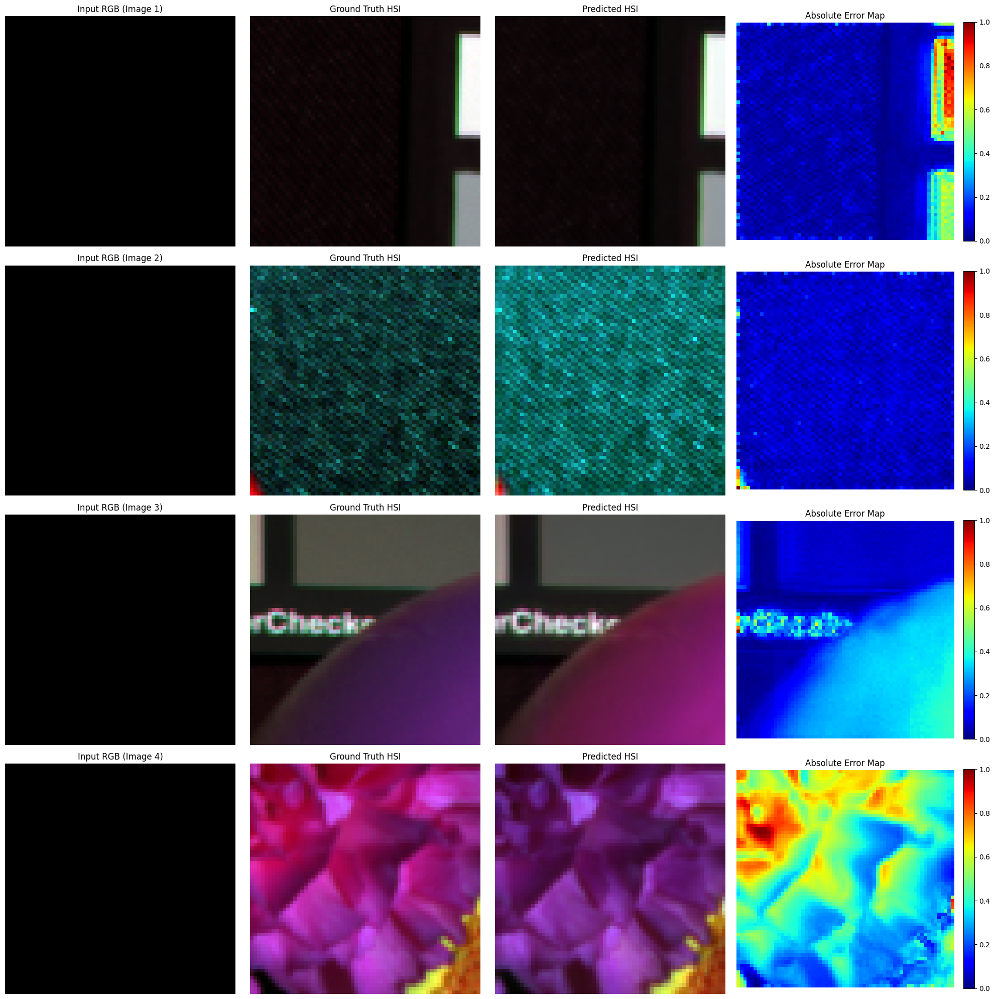

In [17]:
# Block 9: Standalone Visualization
import matplotlib.pyplot as plt
import numpy as np
import torch
import glob
import os
from sklearn.model_selection import train_test_split

print("Starting standalone visualization...")

# --- 1. Re-define necessary parameters ---
# These are needed to load the dataset correctly
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 4 # We only need a small batch for visualization

NUM_IMAGES_TO_SHOW = 4 #
BANDS_TO_DISPLAY = [29, 15, 5] # Three bands (R, G, B) to create a false-color image.

# --- 2. Re-create the Test File List ---
# We must re-run the split logic to find the exact same test files
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi, test_rgb = get_files(test_idx)
    print(f"Found {len(test_hsi)} test files.")

    # --- 3. Create Test Loader ---
    # We set patches_per_image to 1, as we just want to see the images
    test_dataset = HSI_Dataset(test_hsi, test_rgb, PATCH_SIZE, patches_per_image=1, slic_scales=SLIC_SCALES)
    
    # Ensure BATCH_SIZE isn't larger than the number of test images
    final_batch_size = min(BATCH_SIZE, len(test_hsi))
    
    test_loader = DataLoader(test_dataset, batch_size=final_batch_size, shuffle=True, num_workers=2)

    # --- 4. Define Helper Functions ---
    def hsi_to_false_color(hsi_img, bands):
        img_bands = hsi_img[bands, :, :]
        normalized_bands = []
        for band in img_bands:
            min_val, max_val = np.min(band), np.max(band)
            normalized = (band - min_val) / (max_val - min_val + 1e-8)
            normalized_bands.append(normalized)
        false_color_img = np.stack(normalized_bands, axis=-1)
        return false_color_img

    def calculate_error_map(pred, true):
        error = np.sum(np.abs(pred - true), axis=0)
        error = (error - np.min(error)) / (np.max(error) - np.min(error) + 1e-8)
        return error

    # --- 5. Load Model and Get Batch ---
    print(f"Loading best_model.pth onto {DEVICE}...")
    model = HPRN().to(DEVICE)
    model.load_state_dict(torch.load("best_model.pth"))
    model.eval()

    print("Loading one batch of test data...")
    rgb_batch, hsi_batch, semantic_batch = next(iter(test_loader))

    # --- 6. Run Inference ---
    with torch.no_grad():
        rgb_batch_dev = rgb_batch.to(DEVICE)
        semantic_batch_dev = semantic_batch.to(DEVICE)
        pred_hsi_batch = model(rgb_batch_dev, semantic_batch_dev)

    # Move data to CPU/Numpy for plotting
    rgb_batch = rgb_batch.cpu().numpy()
    hsi_batch = hsi_batch.cpu().numpy()
    pred_hsi_batch = pred_hsi_batch.cpu().numpy()

    # --- 7. Plot Results ---
    print(f"Displaying results...")
    
    num_images = min(NUM_IMAGES_TO_SHOW, final_batch_size)
    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

    for i in range(num_images):
        rgb_img = np.transpose(rgb_batch[i], (1, 2, 0))
        true_hsi = hsi_batch[i]
        pred_hsi = pred_hsi_batch[i]
        
        true_hsi_display = hsi_to_false_color(true_hsi, BANDS_TO_DISPLAY)
        pred_hsi_display = hsi_to_false_color(pred_hsi, BANDS_TO_DISPLAY)
        error_map_display = calculate_error_map(pred_hsi, true_hsi)
        
        if num_images == 1: ax_row = axes
        else: ax_row = axes[i]
            
        ax_row[0].imshow(rgb_img); ax_row[0].set_title(f"Input RGB (Image {i+1})"); ax_row[0].axis('off')
        ax_row[1].imshow(true_hsi_display); ax_row[1].set_title("Ground Truth HSI"); ax_row[1].axis('off')
        ax_row[2].imshow(pred_hsi_display); ax_row[2].set_title("Predicted HSI"); ax_row[2].axis('off')
        im = ax_row[3].imshow(error_map_display, cmap='jet'); ax_row[3].set_title("Absolute Error Map"); ax_row[3].axis('off')
        fig.colorbar(im, ax=ax_row[3], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

Starting standalone visualization...
Found 5 test files.
Loading 5 images into memory...


100%|██████████| 5/5 [00:06<00:00,  1.23s/it]


Data loading complete.
Loading best_model.pth onto cuda...
Loading one batch of test data...
Displaying results...


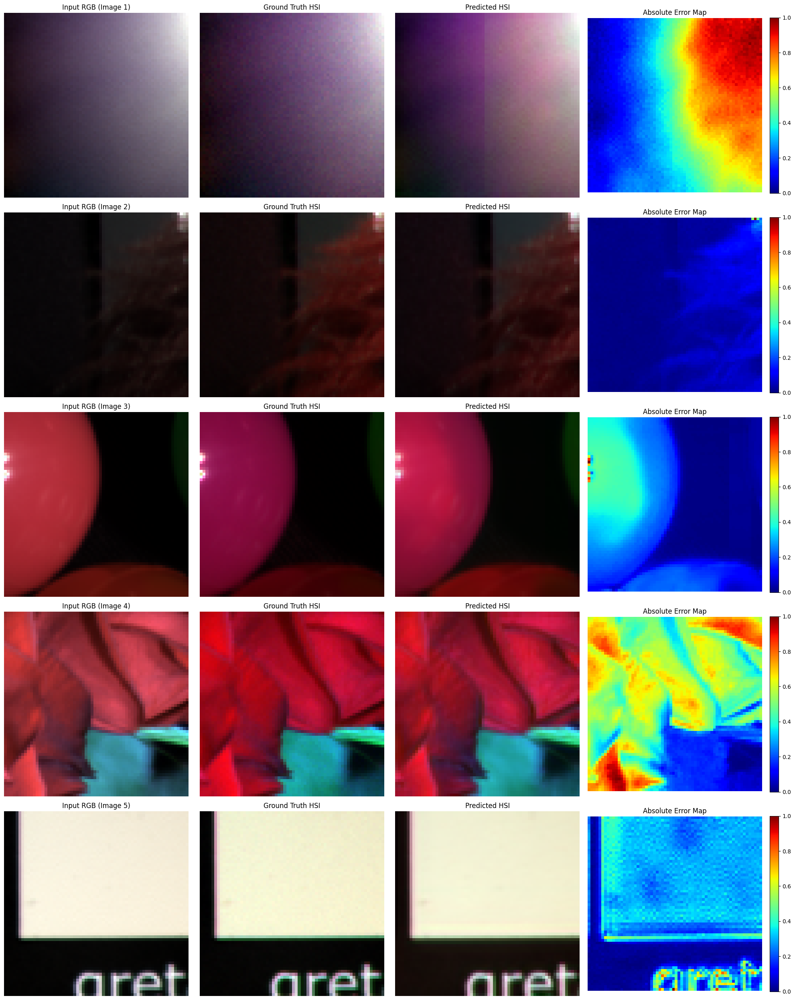

In [18]:
# Block 9 (Revised): Standalone Visualization
import matplotlib.pyplot as plt
import numpy as np
import torch
import glob
import os
from sklearn.model_selection import train_test_split

print("Starting standalone visualization...")

# --- 1. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- FIX 2: Set batch size and num images to 5 ---
NUM_IMAGES_TO_SHOW = 5
BATCH_SIZE = 5

BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 2. Re-create the Test File List ---
# We must re-run the split logic to find the exact same test files
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi, test_rgb = get_files(test_idx)
    print(f"Found {len(test_hsi)} test files.")

    # --- 3. Create Test Loader ---
    # We set patches_per_image to 1, as we just want to see the images
    test_dataset = HSI_Dataset(test_hsi, test_rgb, PATCH_SIZE, patches_per_image=1, slic_scales=SLIC_SCALES)
    
    # Ensure BATCH_SIZE isn't larger than the number of test images
    final_batch_size = min(BATCH_SIZE, len(test_hsi))
    
    # --- FIX 2 (cont.): Use shuffle=False to get a consistent order ---
    test_loader = DataLoader(test_dataset, batch_size=final_batch_size, shuffle=False, num_workers=2)

    # --- 4. Define Helper Functions ---
    
    # --- FIX 1: Add a display function for RGB images ---
    def rgb_to_display(rgb_img):
        """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
        normalized_bands = []
        for band in rgb_img: # rgb_img is (3, H, W)
            min_val, max_val = np.min(band), np.max(band)
            normalized = (band - min_val) / (max_val - min_val + 1e-8)
            normalized_bands.append(normalized)
        # Stack and transpose to (H, W, 3)
        return np.stack(normalized_bands, axis=-1)

    def hsi_to_false_color(hsi_img, bands):
        """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
        img_bands = hsi_img[bands, :, :]
        normalized_bands = []
        for band in img_bands:
            min_val, max_val = np.min(band), np.max(band)
            normalized = (band - min_val) / (max_val - min_val + 1e-8)
            normalized_bands.append(normalized)
        false_color_img = np.stack(normalized_bands, axis=-1)
        return false_color_img

    def calculate_error_map(pred, true):
        """Calculates the normalized absolute error map."""
        error = np.sum(np.abs(pred - true), axis=0)
        error = (error - np.min(error)) / (np.max(error) - np.min(error) + 1e-8)
        return error

    # --- 5. Load Model and Get Batch ---
    print(f"Loading best_model.pth onto {DEVICE}...")
    model = HPRN().to(DEVICE)
    model.load_state_dict(torch.load("best_model.pth"))
    model.eval()

    print("Loading one batch of test data...")
    rgb_batch, hsi_batch, semantic_batch = next(iter(test_loader))

    # --- 6. Run Inference ---
    with torch.no_grad():
        rgb_batch_dev = rgb_batch.to(DEVICE)
        semantic_batch_dev = semantic_batch.to(DEVICE)
        pred_hsi_batch = model(rgb_batch_dev, semantic_batch_dev)

    # Move data to CPU/Numpy for plotting
    rgb_batch = rgb_batch.cpu().numpy()
    hsi_batch = hsi_batch.cpu().numpy()
    pred_hsi_batch = pred_hsi_batch.cpu().numpy()

    # --- 7. Plot Results ---
    print(f"Displaying results...")
    
    # num_images will now be 5
    num_images = min(NUM_IMAGES_TO_SHOW, final_batch_size)
    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

    for i in range(num_images):
        # --- FIX 1 (cont.): Use the new display function ---
        rgb_display = rgb_to_display(rgb_batch[i]) 
        
        true_hsi = hsi_batch[i]
        pred_hsi = pred_hsi_batch[i]
        
        true_hsi_display = hsi_to_false_color(true_hsi, BANDS_TO_DISPLAY)
        pred_hsi_display = hsi_to_false_color(pred_hsi, BANDS_TO_DISPLAY)
        error_map_display = calculate_error_map(pred_hsi, true_hsi)
        
        if num_images == 1: ax_row = axes
        else: ax_row = axes[i]
            
        ax_row[0].imshow(rgb_display); ax_row[0].set_title(f"Input RGB (Image {i+1})"); ax_row[0].axis('off')
        ax_row[1].imshow(true_hsi_display); ax_row[1].set_title("Ground Truth HSI"); ax_row[1].axis('off')
        ax_row[2].imshow(pred_hsi_display); ax_row[2].set_title("Predicted HSI"); ax_row[2].axis('off')
        im = ax_row[3].imshow(error_map_display, cmap='jet'); ax_row[3].set_title("Absolute Error Map"); ax_row[3].axis('off')
        fig.colorbar(im, ax=ax_row[3], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

Starting standalone visualization...
Found 5 test files.
Loading 5 images into memory...


100%|██████████| 5/5 [00:06<00:00,  1.25s/it]


Data loading complete.
Loading best_model.pth onto cuda...
Loading one batch of test data...
Displaying results...


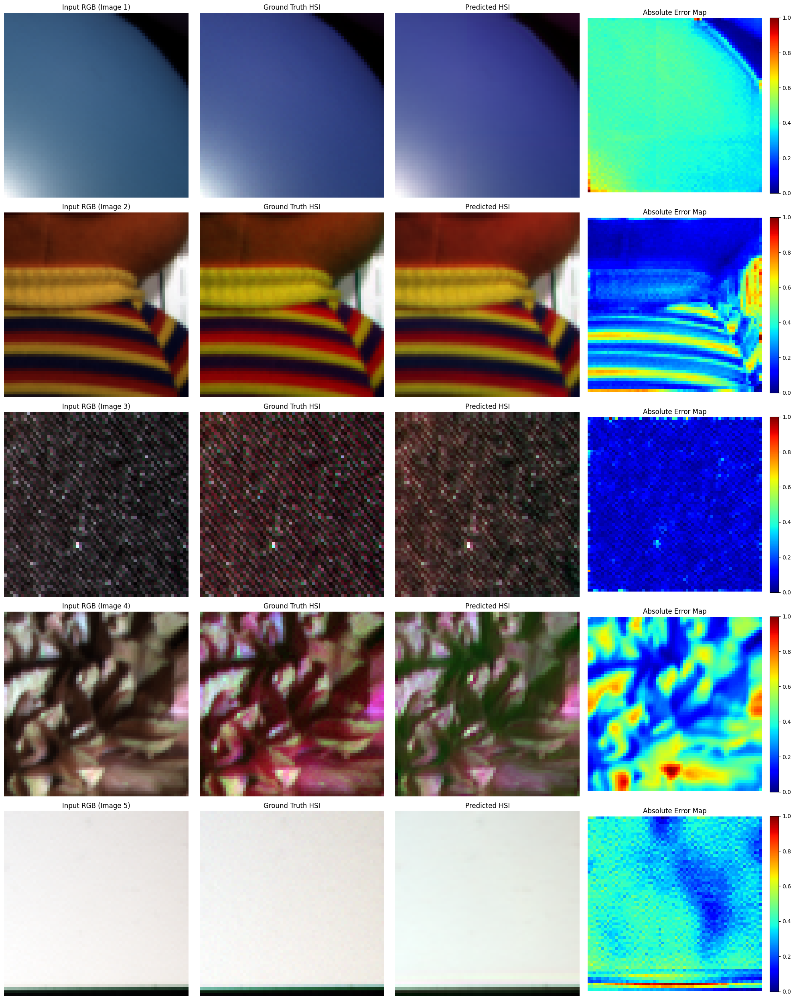

In [20]:
# Block 9 (Revised): Standalone Visualization
import matplotlib.pyplot as plt
import numpy as np
import torch
import glob
import os
from sklearn.model_selection import train_test_split

print("Starting standalone visualization...")

# --- 1. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# --- FIX 2: Set batch size and num images to 5 ---
NUM_IMAGES_TO_SHOW = 5
BATCH_SIZE = 5

BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 2. Re-create the Test File List ---
# We must re-run the split logic to find the exact same test files
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi, test_rgb = get_files(test_idx)
    print(f"Found {len(test_hsi)} test files.")

    # --- 3. Create Test Loader ---
    # We set patches_per_image to 1, as we just want to see the images
    test_dataset = HSI_Dataset(test_hsi, test_rgb, PATCH_SIZE, patches_per_image=1, slic_scales=SLIC_SCALES)
    
    # Ensure BATCH_SIZE isn't larger than the number of test images
    final_batch_size = min(BATCH_SIZE, len(test_hsi))
    
    # --- FIX 2 (cont.): Use shuffle=False to get a consistent order ---
    test_loader = DataLoader(test_dataset, batch_size=final_batch_size, shuffle=False, num_workers=2)

    # --- 4. Define Helper Functions ---
    
    # --- FIX 1: Add a display function for RGB images ---
    def rgb_to_display(rgb_img):
        """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
        normalized_bands = []
        for band in rgb_img: # rgb_img is (3, H, W)
            min_val, max_val = np.min(band), np.max(band)
            normalized = (band - min_val) / (max_val - min_val + 1e-8)
            normalized_bands.append(normalized)
        # Stack and transpose to (H, W, 3)
        return np.stack(normalized_bands, axis=-1)

    def hsi_to_false_color(hsi_img, bands):
        """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
        img_bands = hsi_img[bands, :, :]
        normalized_bands = []
        for band in img_bands:
            min_val, max_val = np.min(band), np.max(band)
            normalized = (band - min_val) / (max_val - min_val + 1e-8)
            normalized_bands.append(normalized)
        false_color_img = np.stack(normalized_bands, axis=-1)
        return false_color_img

    def calculate_error_map(pred, true):
        """Calculates the normalized absolute error map."""
        error = np.sum(np.abs(pred - true), axis=0)
        error = (error - np.min(error)) / (np.max(error) - np.min(error) + 1e-8)
        return error

    # --- 5. Load Model and Get Batch ---
    print(f"Loading best_model.pth onto {DEVICE}...")
    model = HPRN().to(DEVICE)
    model.load_state_dict(torch.load("best_model.pth"))
    model.eval()

    print("Loading one batch of test data...")
    rgb_batch, hsi_batch, semantic_batch = next(iter(test_loader))

    # --- 6. Run Inference ---
    with torch.no_grad():
        rgb_batch_dev = rgb_batch.to(DEVICE)
        semantic_batch_dev = semantic_batch.to(DEVICE)
        pred_hsi_batch = model(rgb_batch_dev, semantic_batch_dev)

    # Move data to CPU/Numpy for plotting
    rgb_batch = rgb_batch.cpu().numpy()
    hsi_batch = hsi_batch.cpu().numpy()
    pred_hsi_batch = pred_hsi_batch.cpu().numpy()

    # --- 7. Plot Results ---
    print(f"Displaying results...")
    
    # num_images will now be 5
    num_images = min(NUM_IMAGES_TO_SHOW, final_batch_size)
    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

    for i in range(num_images):
        # --- FIX 1 (cont.): Use the new display function ---
        rgb_display = rgb_to_display(rgb_batch[i]) 
        
        true_hsi = hsi_batch[i]
        pred_hsi = pred_hsi_batch[i]
        
        true_hsi_display = hsi_to_false_color(true_hsi, BANDS_TO_DISPLAY)
        pred_hsi_display = hsi_to_false_color(pred_hsi, BANDS_TO_DISPLAY)
        error_map_display = calculate_error_map(pred_hsi, true_hsi)
        
        if num_images == 1: ax_row = axes
        else: ax_row = axes[i]
            
        ax_row[0].imshow(rgb_display); ax_row[0].set_title(f"Input RGB (Image {i+1})"); ax_row[0].axis('off')
        ax_row[1].imshow(true_hsi_display); ax_row[1].set_title("Ground Truth HSI"); ax_row[1].axis('off')
        ax_row[2].imshow(pred_hsi_display); ax_row[2].set_title("Predicted HSI"); ax_row[2].axis('off')
        im = ax_row[3].imshow(error_map_display, cmap='jet'); ax_row[3].set_title("Absolute Error Map"); ax_row[3].axis('off')
        fig.colorbar(im, ax=ax_row[3], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

Starting visualization with full image context...
Found 5 test files.
Loading best_model.pth onto cuda...

Processing Test Image 1/5...


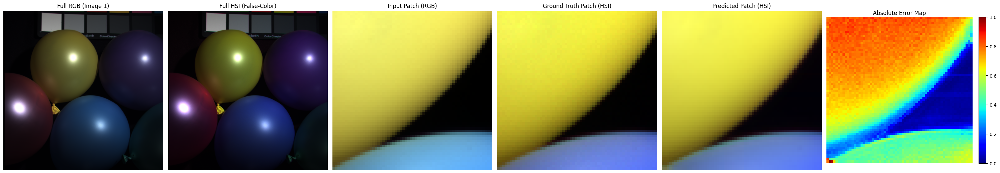


Processing Test Image 2/5...


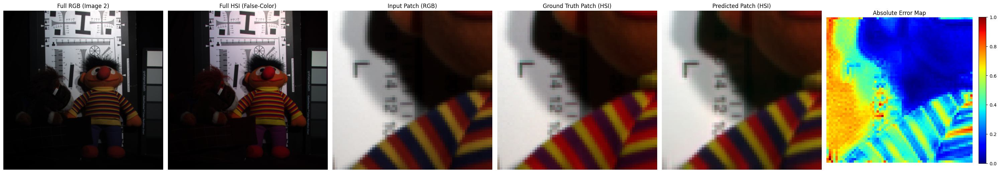


Processing Test Image 3/5...


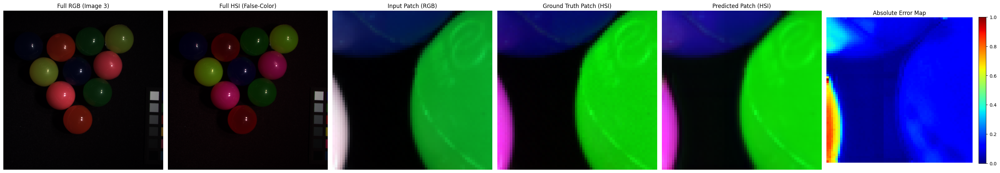


Processing Test Image 4/5...


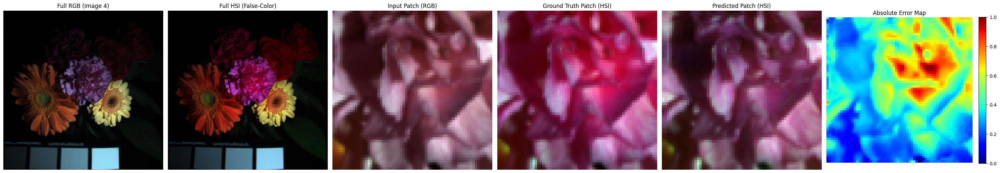


Processing Test Image 5/5...


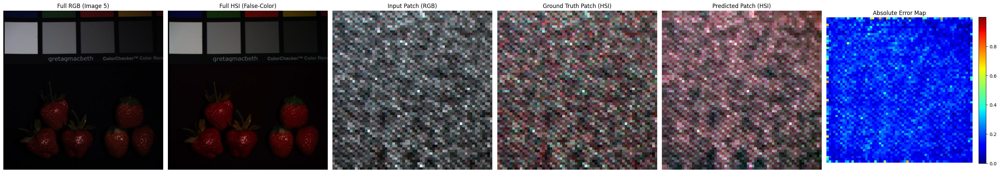

In [22]:
# Block 10: Visualization with Full Image Context
import matplotlib.pyplot as plt
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting visualization with full image context...")

# --- 1. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 2. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def calculate_error_map(pred_chw, true_chw):
    """Calculates the normalized absolute error map from (C, H, W) inputs."""
    error = np.sum(np.abs(pred_chw - true_chw), axis=0)
    error = (error - np.min(error)) / (np.max(error) - np.min(error) + 1e-8)
    return error

# --- 3. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    print(f"Found {len(test_hsi_paths)} test files.")

    # --- 4. Load Model ---
    print(f"Loading best_model.pth onto {DEVICE}...")
    model = HPRN().to(DEVICE)
    model.load_state_dict(torch.load("best_model.pth"))
    model.eval()

    # --- 5. Loop Through Each Test Image ---
    for i in range(len(test_hsi_paths)):
        print(f"\nProcessing Test Image {i+1}/{len(test_hsi_paths)}...")
        
        # --- Load Full Images ---
        hsi_path = test_hsi_paths[i]
        rgb_path = test_rgb_paths[i]
        
        # Load HSI (H, W, C)
        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        # Load RGB (H, W, 3)
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']

        # --- Pre-process Full Images ---
        # 0-255 uint8 version for SLIC
        slic_input_hwc = rgb_full_hwc.astype(np.uint8) 
        
        # Normalized versions for model/display
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        # --- Generate Full Semantic Labels (N, H, W) ---
        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # --- Get Center Patch ---
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # --- Prepare Patches for Model (B, C, H, W) ---
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- Prep Data for Plotting (move to CPU/Numpy) ---
        # Full images (C, H, W)
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        hsi_full_chw = np.transpose(hsi_full_hwc, (2, 0, 1))
        
        # Patches (C, H, W)
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- Plot Results (6 Columns) ---
        fig, axes = plt.subplots(1, 6, figsize=(30, 6))
        
        # 1. Full RGB
        axes[0].imshow(rgb_to_display(rgb_full_chw))
        axes[0].set_title(f"Full RGB (Image {i+1})")
        axes[0].axis('off')

        # 2. Full HSI
        axes[1].imshow(hsi_to_false_color(hsi_full_chw, BANDS_TO_DISPLAY))
        axes[1].set_title("Full HSI (False-Color)")
        axes[1].axis('off')
        
        # 3. Input Patch (RGB)
        axes[2].imshow(rgb_to_display(rgb_patch_chw))
        axes[2].set_title("Input Patch (RGB)")
        axes[2].axis('off')
        
        # 4. Ground Truth Patch (HSI)
        axes[3].imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        axes[3].set_title("Ground Truth Patch (HSI)")
        axes[3].axis('off')
        
        # 5. Predicted Patch (HSI)
        axes[4].imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        axes[4].set_title("Predicted Patch (HSI)")
        axes[4].axis('off')

        # 6. Error Map
        error_map = calculate_error_map(pred_hsi_patch_chw, hsi_patch_chw)
        im = axes[5].imshow(error_map, cmap='jet')
        axes[5].set_title("Absolute Error Map")
        axes[5].axis('off')
        fig.colorbar(im, ax=axes[5], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

Starting visualization with full image context...
Found 5 test files.
Loading best_model.pth onto cuda...

Processing Test Image 1/5...


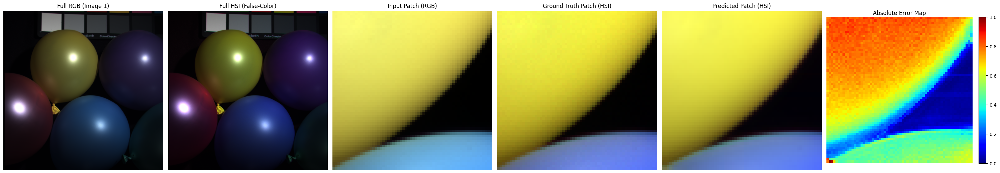


Processing Test Image 2/5...


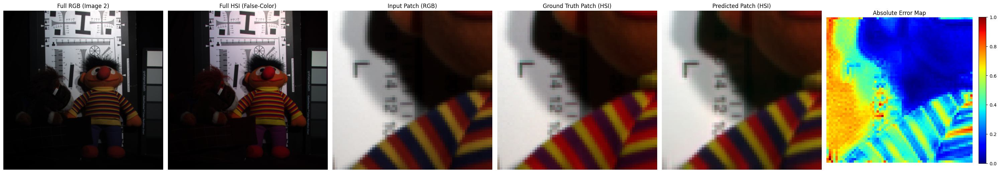


Processing Test Image 3/5...


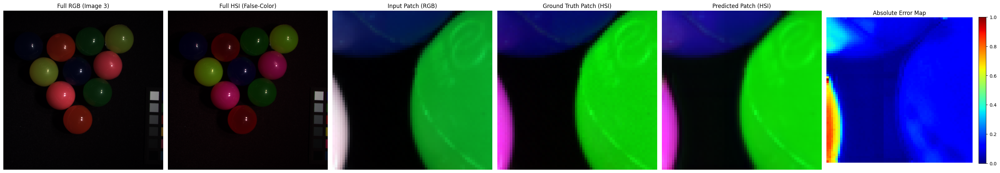


Processing Test Image 4/5...


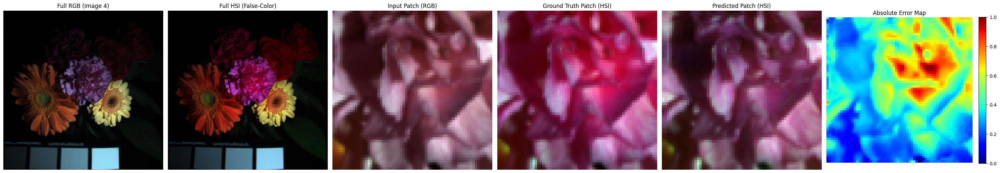


Processing Test Image 5/5...


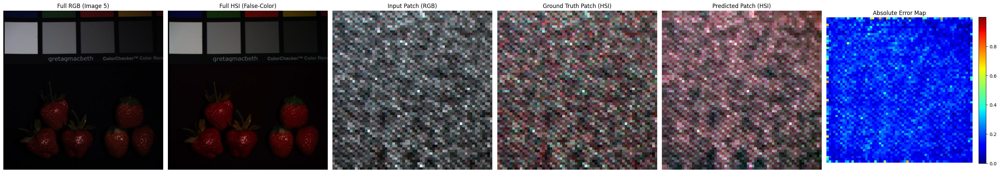

In [23]:
# Block 10: Visualization with Full Image Context
import matplotlib.pyplot as plt
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting visualization with full image context...")

# --- 1. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 2. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def calculate_error_map(pred_chw, true_chw):
    """Calculates the normalized absolute error map from (C, H, W) inputs."""
    error = np.sum(np.abs(pred_chw - true_chw), axis=0)
    error = (error - np.min(error)) / (np.max(error) - np.min(error) + 1e-8)
    return error

# --- 3. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    print(f"Found {len(test_hsi_paths)} test files.")

    # --- 4. Load Model ---
    print(f"Loading best_model.pth onto {DEVICE}...")
    model = HPRN().to(DEVICE)
    model.load_state_dict(torch.load("best_model.pth"))
    model.eval()

    # --- 5. Loop Through Each Test Image ---
    for i in range(len(test_hsi_paths)):
        print(f"\nProcessing Test Image {i+1}/{len(test_hsi_paths)}...")
        
        # --- Load Full Images ---
        hsi_path = test_hsi_paths[i]
        rgb_path = test_rgb_paths[i]
        
        # Load HSI (H, W, C)
        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        # Load RGB (H, W, 3)
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']

        # --- Pre-process Full Images ---
        # 0-255 uint8 version for SLIC
        slic_input_hwc = rgb_full_hwc.astype(np.uint8) 
        
        # Normalized versions for model/display
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        # --- Generate Full Semantic Labels (N, H, W) ---
        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # --- Get Center Patch ---
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # --- Prepare Patches for Model (B, C, H, W) ---
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- Prep Data for Plotting (move to CPU/Numpy) ---
        # Full images (C, H, W)
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        hsi_full_chw = np.transpose(hsi_full_hwc, (2, 0, 1))
        
        # Patches (C, H, W)
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- Plot Results (6 Columns) ---
        fig, axes = plt.subplots(1, 6, figsize=(30, 6))
        
        # 1. Full RGB
        axes[0].imshow(rgb_to_display(rgb_full_chw))
        axes[0].set_title(f"Full RGB (Image {i+1})")
        axes[0].axis('off')

        # 2. Full HSI
        axes[1].imshow(hsi_to_false_color(hsi_full_chw, BANDS_TO_DISPLAY))
        axes[1].set_title("Full HSI (False-Color)")
        axes[1].axis('off')
        
        # 3. Input Patch (RGB)
        axes[2].imshow(rgb_to_display(rgb_patch_chw))
        axes[2].set_title("Input Patch (RGB)")
        axes[2].axis('off')
        
        # 4. Ground Truth Patch (HSI)
        axes[3].imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        axes[3].set_title("Ground Truth Patch (HSI)")
        axes[3].axis('off')
        
        # 5. Predicted Patch (HSI)
        axes[4].imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        axes[4].set_title("Predicted Patch (HSI)")
        axes[4].axis('off')

        # 6. Error Map
        error_map = calculate_error_map(pred_hsi_patch_chw, hsi_patch_chw)
        im = axes[5].imshow(error_map, cmap='jet')
        axes[5].set_title("Absolute Error Map")
        axes[5].axis('off')
        fig.colorbar(im, ax=axes[5], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

Starting all-in-one visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 1...
Generating plot...


IndexError: index 9 is out of bounds for axis 0 with size 9

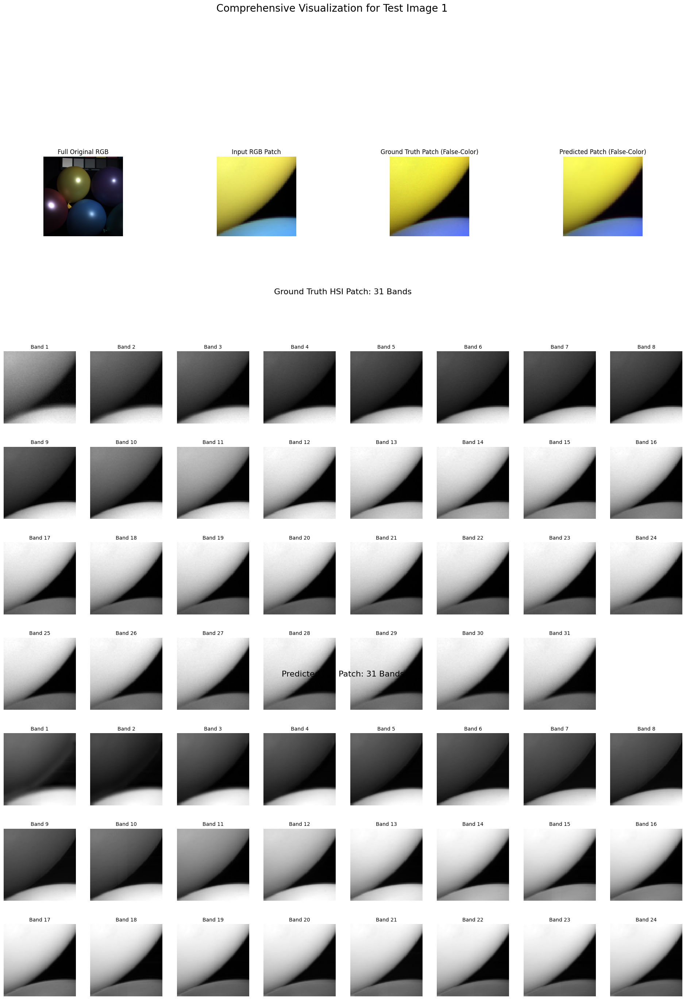

In [27]:
# Block 11: All-in-One Visualization for a Single Test Image (Corrected)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting all-in-one visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 0 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
# --- FIX IS HERE ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
# --- END FIX ---
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating plot...")
        fig = plt.figure(figsize=(24, 30))
        gs = gridspec.GridSpec(9, 8, figure=fig)
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.02)

        # --- Row 1: Summary Images ---
        ax_full_rgb = fig.add_subplot(gs[0, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB")
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch")
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)")
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)")
        ax_patch_pred.axis('off')

        # --- Rows 2-5: Ground Truth Bands ---
        fig_text = fig.add_subplot(gs[1, :])
        fig_text.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=16, ha='center', va='center')
        fig_text.axis('off')
        
        for i in range(31):
            row = (i // 8) + 2 # Start from grid row 2
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 6-9: Predicted Bands ---
        fig_text = fig.add_subplot(gs[5, :])
        fig_text.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=16, ha='center', va='center')
        fig_text.axis('off')

        for i in range(31):
            row = (i // 8) + 6 # Start from grid row 6
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()

Starting all-in-one visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 1...
Generating plot...


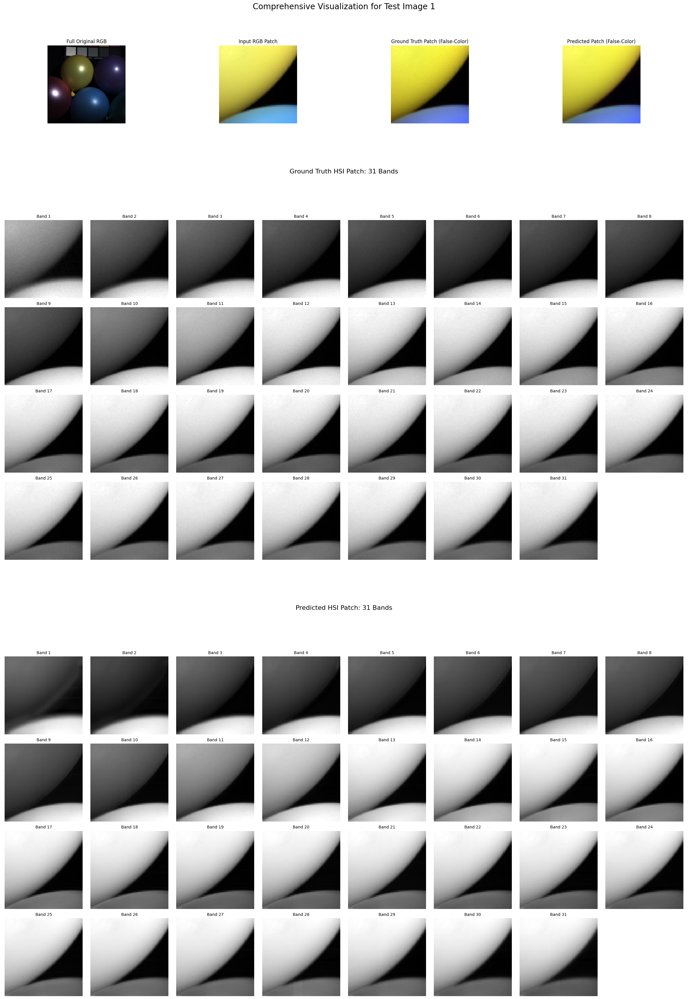

In [29]:
# Block 11 (Corrected): All-in-One Visualization for a Single Test Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting all-in-one visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 0 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating plot...")
        
        # --- FIX: Changed GridSpec rows from 9 to 11 ---
        fig = plt.figure(figsize=(24, 34)) # Made figure taller
        gs = gridspec.GridSpec(11, 8, figure=fig) # Changed from 9 to 11 rows
        # --- END FIX ---
        
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.02)

        # --- Row 1: Summary Images ---
        ax_full_rgb = fig.add_subplot(gs[0, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB")
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch")
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)")
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)")
        ax_patch_pred.axis('off')

        # --- Rows 2-5: Ground Truth Bands ---
        fig_text_gt = fig.add_subplot(gs[1, :])
        fig_text_gt.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=16, ha='center', va='center')
        fig_text_gt.axis('off')
        
        for i in range(31):
            row = (i // 8) + 2 # Start from grid row 2
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 6-9 (now 7-10): Predicted Bands ---
        
        # --- FIX: Changed header row from 5 to 6 ---
        fig_text_pred = fig.add_subplot(gs[6, :]) # Was gs[5, :]
        # --- END FIX ---
        fig_text_pred.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=16, ha='center', va='center')
        fig_text_pred.axis('off')

        for i in range(31):
            # --- FIX: Changed start row from +6 to +7 ---
            row = (i // 8) + 7 # Was + 6
            # --- END FIX ---
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()

Starting combined visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 1...
Generating large combined plot...


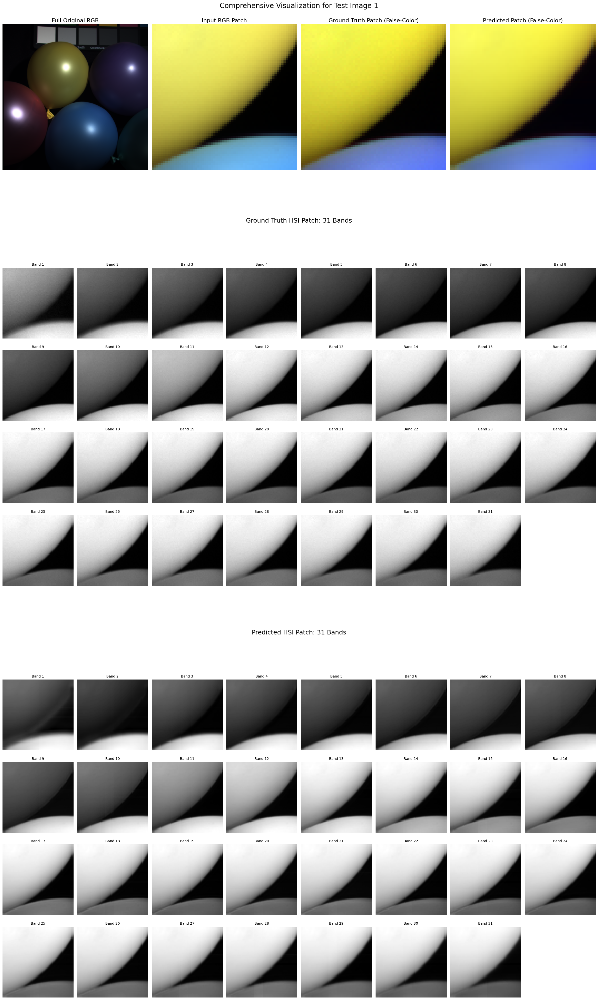

In [33]:
# Block 13: Combined Plot (Large Summary + All Bands)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting combined visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 0 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating large combined plot...")
        
        # Create a tall figure (24 wide, 40 high)
        fig = plt.figure(figsize=(24, 40))
        # Create a 12-row grid
        gs = gridspec.GridSpec(12, 8, figure=fig)
        
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.0)

        # --- Rows 0-1: Large Summary Images ---
        # Each summary image gets a 2x2 block in the grid
        ax_full_rgb = fig.add_subplot(gs[0:2, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB", fontsize=16)
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0:2, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch", fontsize=16)
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0:2, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)", fontsize=16)
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0:2, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)", fontsize=16)
        ax_patch_pred.axis('off')

        # --- Rows 2-6: Ground Truth Bands ---
        fig_text_gt = fig.add_subplot(gs[2, :]) # Header in row 2
        fig_text_gt.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_gt.axis('off')
        
        for i in range(31):
            row = (i // 8) + 3 # Start from grid row 3
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 7-11: Predicted Bands ---
        fig_text_pred = fig.add_subplot(gs[7, :]) # Header in row 7
        fig_text_pred.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_pred.axis('off')

        for i in range(31):
            row = (i // 8) + 8 # Start from grid row 8
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()

Starting combined visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 2...
Generating large combined plot...


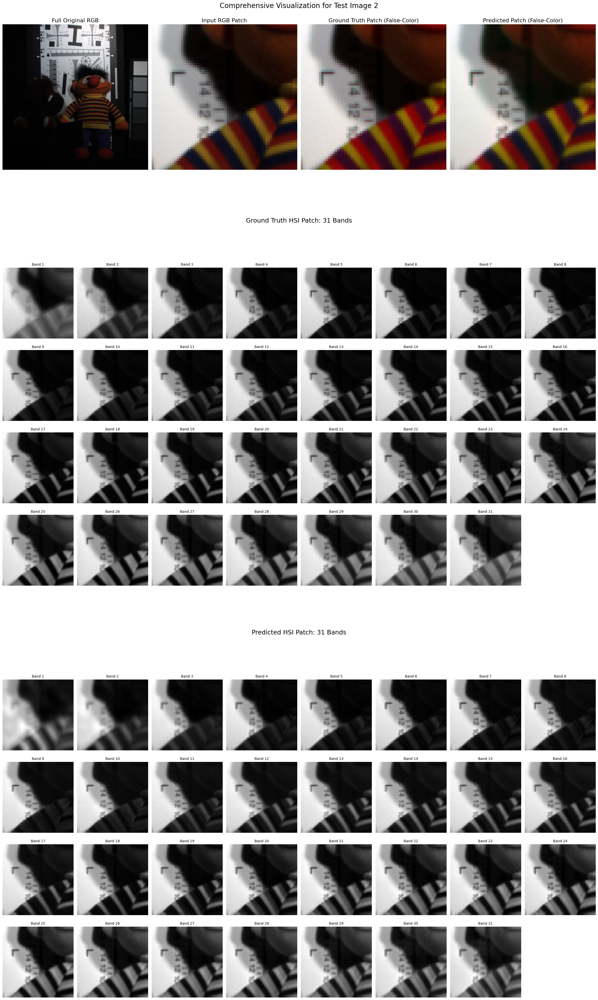

In [35]:
# Block 13: Combined Plot (Large Summary + All Bands)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting combined visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 1 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating large combined plot...")
        
        # Create a tall figure (24 wide, 40 high)
        fig = plt.figure(figsize=(24, 40))
        # Create a 12-row grid
        gs = gridspec.GridSpec(12, 8, figure=fig)
        
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.0)

        # --- Rows 0-1: Large Summary Images ---
        # Each summary image gets a 2x2 block in the grid
        ax_full_rgb = fig.add_subplot(gs[0:2, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB", fontsize=16)
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0:2, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch", fontsize=16)
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0:2, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)", fontsize=16)
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0:2, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)", fontsize=16)
        ax_patch_pred.axis('off')

        # --- Rows 2-6: Ground Truth Bands ---
        fig_text_gt = fig.add_subplot(gs[2, :]) # Header in row 2
        fig_text_gt.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_gt.axis('off')
        
        for i in range(31):
            row = (i // 8) + 3 # Start from grid row 3
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 7-11: Predicted Bands ---
        fig_text_pred = fig.add_subplot(gs[7, :]) # Header in row 7
        fig_text_pred.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_pred.axis('off')

        for i in range(31):
            row = (i // 8) + 8 # Start from grid row 8
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()

Starting combined visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 3...
Generating large combined plot...


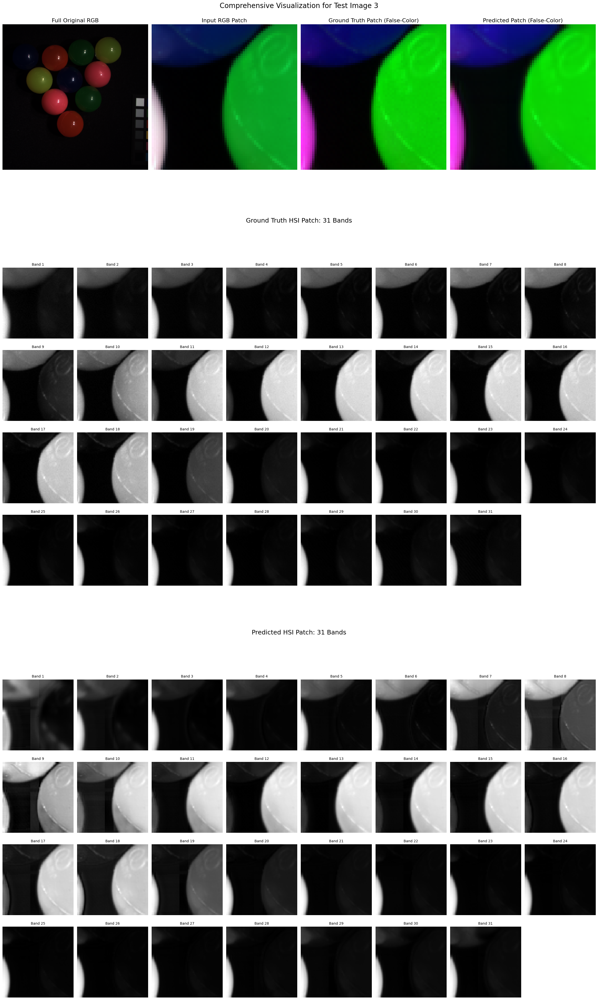

In [36]:
# Block 13: Combined Plot (Large Summary + All Bands)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting combined visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 2 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating large combined plot...")
        
        # Create a tall figure (24 wide, 40 high)
        fig = plt.figure(figsize=(24, 40))
        # Create a 12-row grid
        gs = gridspec.GridSpec(12, 8, figure=fig)
        
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.0)

        # --- Rows 0-1: Large Summary Images ---
        # Each summary image gets a 2x2 block in the grid
        ax_full_rgb = fig.add_subplot(gs[0:2, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB", fontsize=16)
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0:2, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch", fontsize=16)
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0:2, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)", fontsize=16)
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0:2, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)", fontsize=16)
        ax_patch_pred.axis('off')

        # --- Rows 2-6: Ground Truth Bands ---
        fig_text_gt = fig.add_subplot(gs[2, :]) # Header in row 2
        fig_text_gt.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_gt.axis('off')
        
        for i in range(31):
            row = (i // 8) + 3 # Start from grid row 3
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 7-11: Predicted Bands ---
        fig_text_pred = fig.add_subplot(gs[7, :]) # Header in row 7
        fig_text_pred.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_pred.axis('off')

        for i in range(31):
            row = (i // 8) + 8 # Start from grid row 8
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()

Starting combined visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 4...
Generating large combined plot...


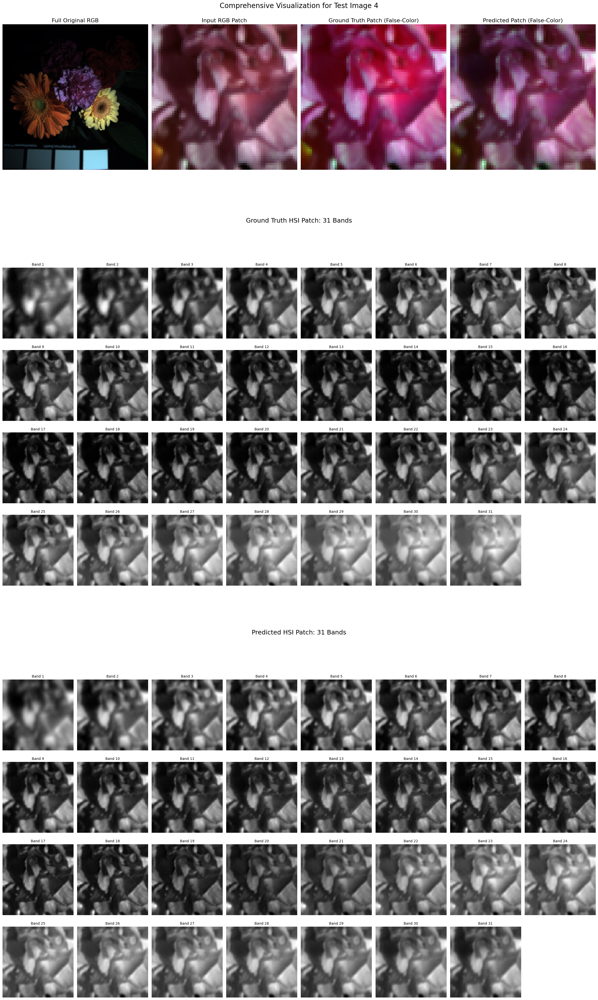

In [37]:
# Block 13: Combined Plot (Large Summary + All Bands)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting combined visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 3 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating large combined plot...")
        
        # Create a tall figure (24 wide, 40 high)
        fig = plt.figure(figsize=(24, 40))
        # Create a 12-row grid
        gs = gridspec.GridSpec(12, 8, figure=fig)
        
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.0)

        # --- Rows 0-1: Large Summary Images ---
        # Each summary image gets a 2x2 block in the grid
        ax_full_rgb = fig.add_subplot(gs[0:2, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB", fontsize=16)
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0:2, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch", fontsize=16)
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0:2, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)", fontsize=16)
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0:2, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)", fontsize=16)
        ax_patch_pred.axis('off')

        # --- Rows 2-6: Ground Truth Bands ---
        fig_text_gt = fig.add_subplot(gs[2, :]) # Header in row 2
        fig_text_gt.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_gt.axis('off')
        
        for i in range(31):
            row = (i // 8) + 3 # Start from grid row 3
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 7-11: Predicted Bands ---
        fig_text_pred = fig.add_subplot(gs[7, :]) # Header in row 7
        fig_text_pred.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_pred.axis('off')

        for i in range(31):
            row = (i // 8) + 8 # Start from grid row 8
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()

Starting combined visualization...
Loading best_model.pth onto cuda...
Loading and processing Test Image 5...
Generating large combined plot...


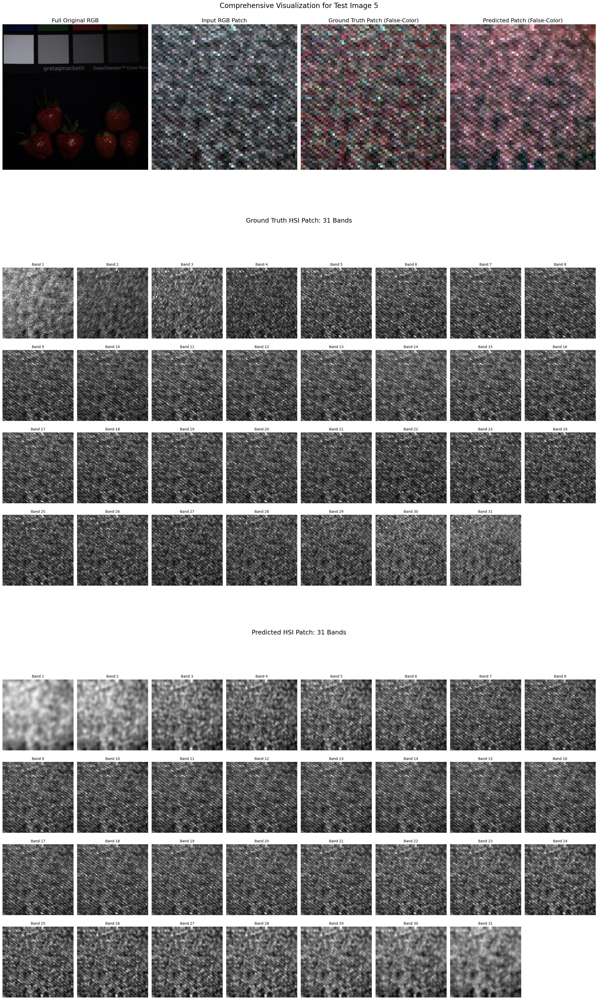

In [38]:
# Block 13: Combined Plot (Large Summary + All Bands)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import glob
import os
import scipy.io
from skimage import segmentation
from sklearn.model_selection import train_test_split

print("Starting combined visualization...")

# --- 1. Select Test Image ---
TEST_IMAGE_INDEX = 4 # Use 0 for the first test image, 1 for the second, etc.

# --- 2. Re-define necessary parameters ---
DATA_DIR = "/kaggle/input/cave-dataset/Data" # Update this path
PATCH_SIZE = 64
SLIC_SCALES = [8, 12, 16, 20]
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BANDS_TO_DISPLAY = [29, 15, 5] # HSI bands for false-color

# --- 3. Define Helper Functions ---
def rgb_to_display(rgb_img_chw):
    """Converts (C, H, W) RGB to (H, W, 3) displayable, contrast-stretched image."""
    normalized_bands = []
    for band in rgb_img_chw: # rgb_img is (3, H, W)
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

def hsi_to_false_color(hsi_img_chw, bands):
    """Converts (C, H, W) HSI to (H, W, 3) displayable, false-color image."""
    img_bands = hsi_img_chw[bands, :, :]
    normalized_bands = []
    for band in img_bands:
        min_val, max_val = np.min(band), np.max(band)
        normalized = (band - min_val) / (max_val - min_val + 1e-8)
        normalized_bands.append(normalized)
    return np.stack(normalized_bands, axis=-1)

# --- 4. Re-create the Test File List ---
hsi_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "HSI", "*.mat")))
rgb_files = sorted(glob.glob(os.path.join(DATA_DIR, "*", "RGB", "*.mat")))

if not hsi_files or not rgb_files:
    print("Error: Could not find dataset files. Check DATA_DIR path.")
else:
    indices = list(range(len(hsi_files)))
    train_idx, temp_idx = train_test_split(indices, test_size=0.30, random_state=42)
    val_idx, test_idx = train_test_split(temp_idx, test_size=0.50, random_state=42)
    
    def get_files(idx_list):
        return [hsi_files[i] for i in idx_list], [rgb_files[i] for i in idx_list]
    
    test_hsi_paths, test_rgb_paths = get_files(test_idx)
    
    if TEST_IMAGE_INDEX >= len(test_hsi_paths):
        print(f"Error: TEST_IMAGE_INDEX {TEST_IMAGE_INDEX} is out of bounds. Max index is {len(test_hsi_paths) - 1}.")
    else:
        # --- 5. Load Model ---
        print(f"Loading best_model.pth onto {DEVICE}...")
        model = HPRN().to(DEVICE)
        model.load_state_dict(torch.load("best_model.pth"))
        model.eval()

        # --- 6. Load and Process the Single Test Image ---
        print(f"Loading and processing Test Image {TEST_IMAGE_INDEX + 1}...")
        hsi_path = test_hsi_paths[TEST_IMAGE_INDEX]
        rgb_path = test_rgb_paths[TEST_IMAGE_INDEX]

        hsi_full_hwc = scipy.io.loadmat(hsi_path)['hsi']
        rgb_full_hwc = scipy.io.loadmat(rgb_path)['rgb']
        
        slic_input_hwc = rgb_full_hwc.astype(np.uint8)
        hsi_full_hwc = np.float32(hsi_full_hwc) / np.max(hsi_full_hwc)
        rgb_full_hwc = np.float32(rgb_full_hwc) / 255.0

        semantic_label_list = []
        for s in SLIC_SCALES:
            labels = segmentation.slic(slic_input_hwc, start_label=1, n_segments=s, compactness=10)
            semantic_label_list.append(labels[None, :])
        semantic_full_nhw = np.concatenate(semantic_label_list, axis=0)

        # Get Center Patch
        h, w, _ = hsi_full_hwc.shape
        start_h = (h - PATCH_SIZE) // 2
        start_w = (w - PATCH_SIZE) // 2
        
        hsi_patch_hwc = hsi_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        rgb_patch_hwc = rgb_full_hwc[start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE, :]
        semantic_patch_nhw = semantic_full_nhw[:, start_h : start_h + PATCH_SIZE, start_w : start_w + PATCH_SIZE]

        # Prepare for Model
        rgb_patch_tensor = torch.from_numpy(np.transpose(rgb_patch_hwc, (2, 0, 1))).unsqueeze(0).to(DEVICE)
        semantic_patch_tensor = torch.from_numpy(semantic_patch_nhw).unsqueeze(0).to(DEVICE)
        
        # --- 7. Run Inference ---
        with torch.no_grad():
            pred_hsi_patch = model(rgb_patch_tensor, semantic_patch_tensor)
        
        # --- 8. Prep Data for Plotting ---
        rgb_full_chw = np.transpose(rgb_full_hwc, (2, 0, 1))
        
        rgb_patch_chw = rgb_patch_tensor.cpu().numpy().squeeze(0)
        hsi_patch_chw = np.transpose(hsi_patch_hwc, (2, 0, 1))
        pred_hsi_patch_chw = pred_hsi_patch.cpu().numpy().squeeze(0)

        # --- 9. Create Plot ---
        print("Generating large combined plot...")
        
        # Create a tall figure (24 wide, 40 high)
        fig = plt.figure(figsize=(24, 40))
        # Create a 12-row grid
        gs = gridspec.GridSpec(12, 8, figure=fig)
        
        fig.suptitle(f"Comprehensive Visualization for Test Image {TEST_IMAGE_INDEX + 1}", fontsize=20, y=1.0)

        # --- Rows 0-1: Large Summary Images ---
        # Each summary image gets a 2x2 block in the grid
        ax_full_rgb = fig.add_subplot(gs[0:2, 0:2])
        ax_full_rgb.imshow(rgb_to_display(rgb_full_chw))
        ax_full_rgb.set_title("Full Original RGB", fontsize=16)
        ax_full_rgb.axis('off')

        ax_patch_rgb = fig.add_subplot(gs[0:2, 2:4])
        ax_patch_rgb.imshow(rgb_to_display(rgb_patch_chw))
        ax_patch_rgb.set_title("Input RGB Patch", fontsize=16)
        ax_patch_rgb.axis('off')

        ax_patch_gt = fig.add_subplot(gs[0:2, 4:6])
        ax_patch_gt.imshow(hsi_to_false_color(hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_gt.set_title("Ground Truth Patch (False-Color)", fontsize=16)
        ax_patch_gt.axis('off')

        ax_patch_pred = fig.add_subplot(gs[0:2, 6:8])
        ax_patch_pred.imshow(hsi_to_false_color(pred_hsi_patch_chw, BANDS_TO_DISPLAY))
        ax_patch_pred.set_title("Predicted Patch (False-Color)", fontsize=16)
        ax_patch_pred.axis('off')

        # --- Rows 2-6: Ground Truth Bands ---
        fig_text_gt = fig.add_subplot(gs[2, :]) # Header in row 2
        fig_text_gt.text(0.5, 0.5, "Ground Truth HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_gt.axis('off')
        
        for i in range(31):
            row = (i // 8) + 3 # Start from grid row 3
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')

        # --- Rows 7-11: Predicted Bands ---
        fig_text_pred = fig.add_subplot(gs[7, :]) # Header in row 7
        fig_text_pred.text(0.5, 0.5, "Predicted HSI Patch: 31 Bands", fontsize=18, ha='center', va='center')
        fig_text_pred.axis('off')

        for i in range(31):
            row = (i // 8) + 8 # Start from grid row 8
            col = i % 8
            ax_band = fig.add_subplot(gs[row, col])
            ax_band.imshow(pred_hsi_patch_chw[i, :, :], cmap='gray')
            ax_band.set_title(f"Band {i+1}", fontsize=10)
            ax_band.axis('off')
        
        plt.tight_layout()
        plt.show()